In [147]:
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime, timedelta
import pandas as pd

import sys
sys.path.append('/Users/jessbreda/Desktop/github/jbreda_animal_training/notebooks/_active_experiments/FixationGrower')
import config_alpha_experiment as alpha_config

import behav_viz.visualize as viz
import behav_viz.utils as utils
from behav_viz.utils import plot_utils as pu
from TCM_mtg_2024_09_05_FixationExperiment import *
FIGURES_PATH = utils.dir_utils.get_figures_path("rats", "alpha")

# settings
%load_ext autoreload
%autoreload 2
sns.set_context("talk")

DATA_PATH = "/Users/jessbreda/Desktop/github/jbreda_animal_training/data/meetings/2024_12_LabMeeting/"
FIGURES_PATH = "/Users/jessbreda/Desktop/github/jbreda_animal_training/figures/meetings/2024_12_LabMeeting/"
LOAD_FROM_DATAJOINT = False

if LOAD_FROM_DATAJOINT:
    import behav_viz.ingest as ingest


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# 0. Load In & Clean

need to drop
R044 for all dates after 2024-08-20


In [5]:
if LOAD_FROM_DATAJOINT:
    date_min = alpha_config.ALPHA_START_DATES["alpha_1"]
    date_max = "2024-10-17"  # R056 was the last to finish on 2024-10-15
    tdf = ingest.create_trials_df.create_trials_df_from_dj(
        alpha_config.ALPHA_ANIMALS, date_min, date_max=date_max
    )

    tdf = ingest.drop_dates(tdf, alpha_config.ALPHA_DATE_DROPS)

    r044_max_date = pd.Timestamp(
        "2024-08-18"
    ).date()  # this animal had a rig break and needs to be dropped
    tdf = tdf.query("not (animal_id == 'R044' and date > @r044_max_date)")

    # remove spoke stages and post probe stages
    tdf = tdf.query("stage > 4 and stage < 11")
    tdf.to_csv(DATA_PATH + "2024_12_lab_meeting_alpha_trials.csv", index=False)
else:
    tdf = pd.read_csv(
        DATA_PATH + "2024_12_lab_meeting_alpha_trials.csv", low_memory=False
    )

## 0.1 Identifying animals


In [6]:
aid_have_reached_target = (
    tdf.query("has_reached_target_fixation == 1").animal_id.unique().tolist()
)
print(aid_have_reached_target)
aid_dropped_out = ["R044"]

['R040', 'R041', 'R042', 'R043', 'R045', 'R046', 'R047', 'R048', 'R049', 'R050', 'R051', 'R052', 'R053', 'R054', 'R055', 'R056', 'R057']


## 0.2 Shared variables


In [7]:
growing_stages = [5, 6, 7]
probe_stages = [9, 10]

# 1. Robustness


## 1.1 Number of Days in Stage 5 (C -> S Basics)


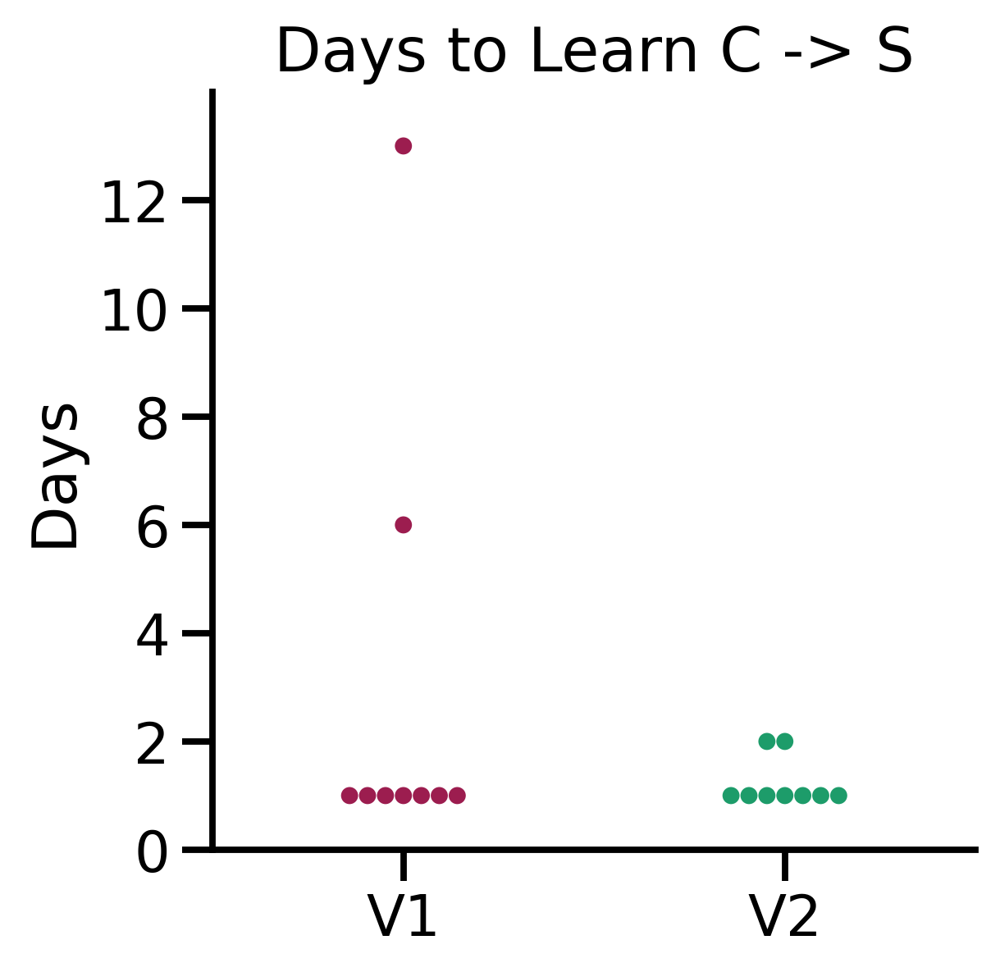

In [8]:
fig, ax = pu.make_fig("s")
stage_5_df = viz.df_preperation.make_days_in_stage_df(
    tdf,
    min_stage=5,
    max_stage=5,
)
sns.swarmplot(
    data=stage_5_df,
    x="fix_experiment",
    y="n_days",
    ax=ax,
    palette=pu.ALPHA_PALLETTE,
    hue="fix_experiment",
    order=["V1", "V2"],
)
sns.despine()

_ = ax.set_yticks(range(0, 14, 2))
_ = ax.set(ylabel="Days", xlabel="", title="Days to Learn C -> S", ylim=(0, 14))

## 1.2 Number of Animals to Reach Target


In [9]:
target_yield_df, success_rates = make_target_yield_df(
    aid_still_growing=[], aid_reached_target=aid_have_reached_target
)

# save out target yield df and success rates (save as an npz)
target_yield_df.to_csv(DATA_PATH + "1_2_alpha_target_yield_df.csv", index=False)
np.save(DATA_PATH + "1_2_alpha_success_rates.npy", success_rates)

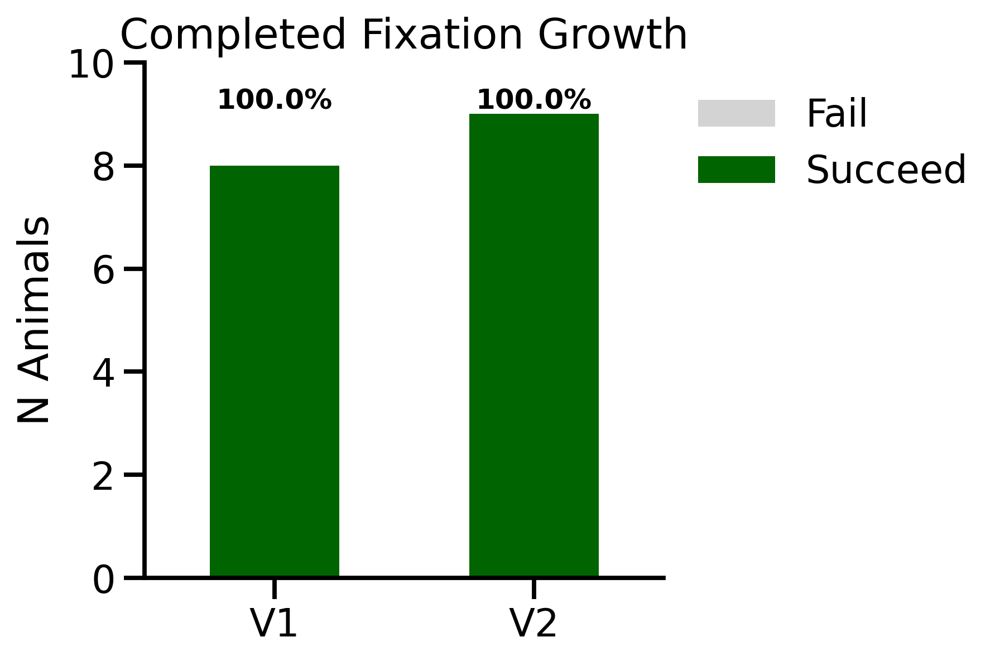

In [10]:
fig, ax = pu.make_fig("s")

colors = {"Succeed": "darkgreen", "Fail": "lightgray"}

# Pivot the DataFrame to get the data in the right format for stacking
df_pivot = target_yield_df.pivot(
    index="fix_experiment", columns="outcome", values="count"
)

# Plot the stacked bar chart
df_pivot.plot(
    kind="bar", stacked=True, color=[colors[col] for col in df_pivot.columns], ax=ax
)


x_pos = [0, 1]
for rate, x in zip(success_rates, x_pos):
    ax.text(
        x,
        9.1,
        str(round(rate * 100, 1)) + "%",
        ha="center",
        fontsize=12,
        fontweight="black",
    )

# Add labels and title
ax.set(ylabel=("N Animals"), xlabel="", ylim=(0, 10), title="Completed Fixation Growth")
ax.legend(title=None, bbox_to_anchor=(1, 1), frameon=False)
sns.despine()

# unrotate x labels
ax.tick_params(rotation=0)

# 2. Speed


## 2.1 Over Day Trajectories


In [11]:
xlabel = "Days Growing"
ylim = (-0.1, 2.5)
xlim = (-0.5, 60)
min_stage = 5
max_stage = 7

### 2.1.1 Single Animal


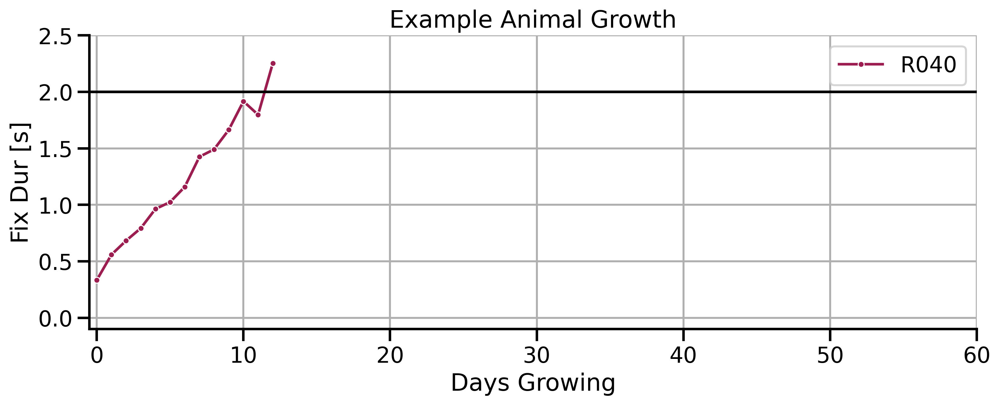

In [12]:
fig, ax = pu.make_fig()
example_animal = "R040"
viz.FixationGrower.plots.plot_fixation_dur_over_days(
    tdf.query("animal_id == @example_animal").copy(),
    ax=ax,
    min_stage=min_stage,
    max_stage=max_stage,
    color=pu.ALPHA_V1_color,
    marker=".",
    lw=2,
    label=example_animal,
)

_ = ax.set(
    xlabel=xlabel,
    ylim=ylim,
    xlim=xlim,
    title="Example Animal Growth",
)

sns.despine()
# save fig
fig.savefig(
    FIGURES_PATH + "2_1_1_example_animal_growth.png", dpi=300, bbox_inches="tight"
)

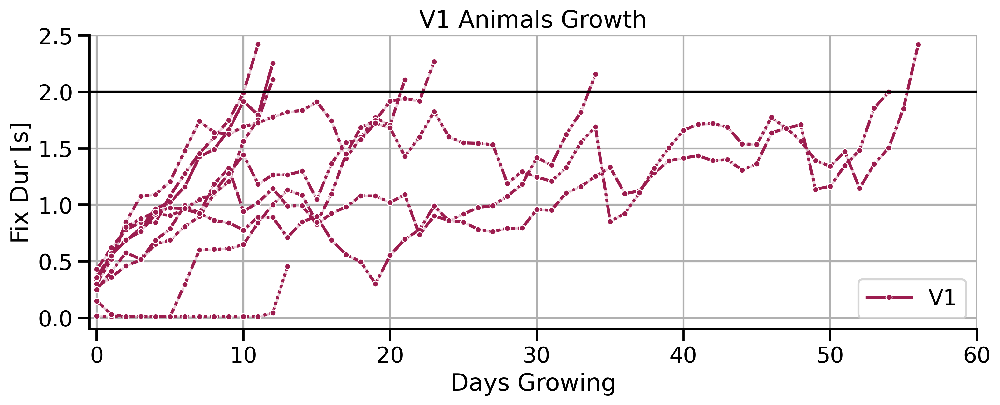

In [13]:
fig, ax = pu.make_fig()
viz.FixationGrower.exp_compare_alpha.plot_fixation_dur_compare_experiment(
    tdf.query("fix_experiment == 'V1'").copy(), ax=ax
)

ax.set(xlabel=xlabel, ylim=ylim, xlim=xlim, title="V1 Animals Growth")

sns.despine()

# Remove the default legend with style information
ax.get_legend().remove()

# Add a new legend with only the hue information
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles[1:2], labels=labels[1:2], loc="lower right")

# save fig
fig.savefig(FIGURES_PATH + "2_1_1_v1_animals_growth.png", dpi=300, bbox_inches="tight")

### 2.1.2 All Animals


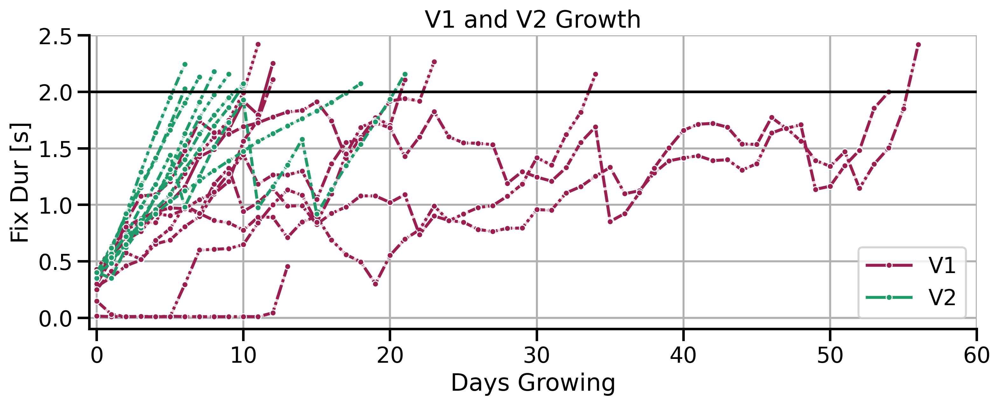

In [14]:
fig, ax = pu.make_fig()
viz.FixationGrower.exp_compare_alpha.plot_fixation_dur_compare_experiment(tdf, ax=ax)

ax.set(xlabel=xlabel, ylim=ylim, xlim=xlim, title="V1 and V2 Growth")

sns.despine()

# Remove the default legend with style information
ax.get_legend().remove()

# Add a new legend with only the hue information
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles[1:3], labels=labels[1:3])

# save fig
fig.savefig(FIGURES_PATH + "2_1_2_all_animals_growth.png", dpi=300, bbox_inches="tight")

## 2.2 Summary of Speed


### 2.2.1 Box plot time to target


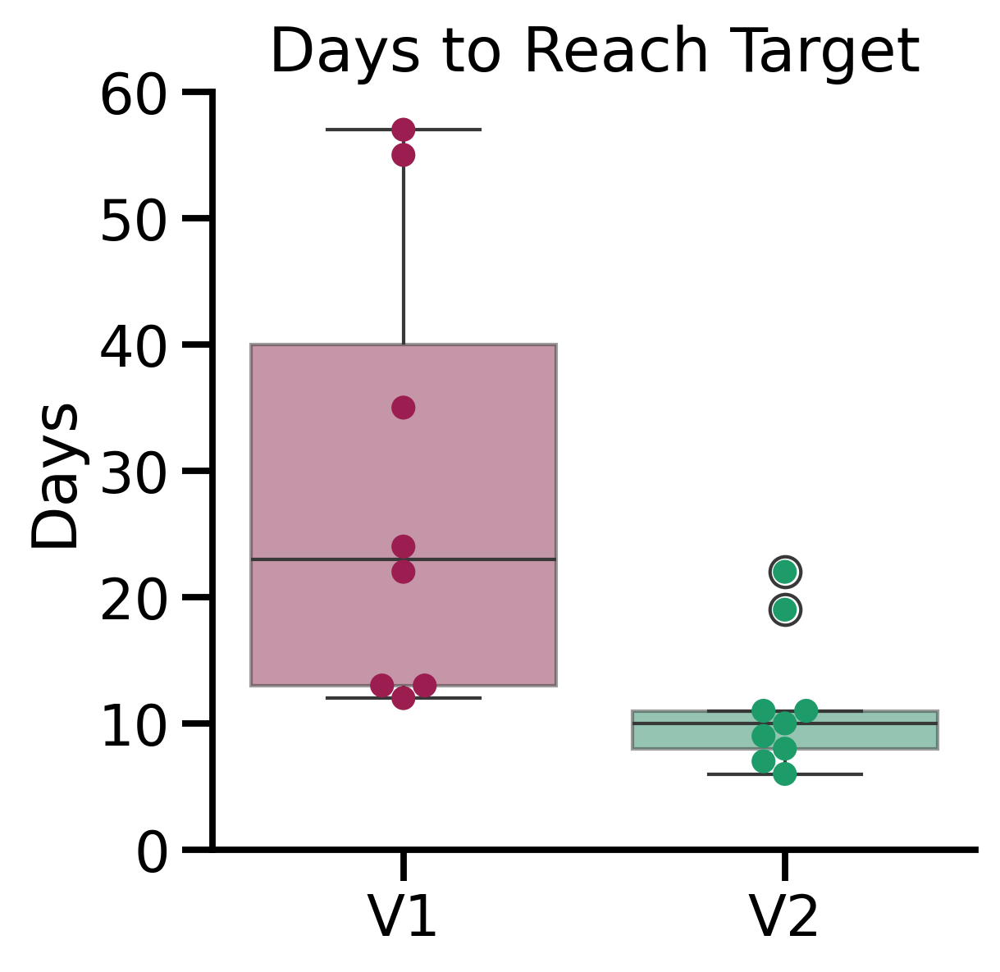

In [15]:
fig, ax = pu.make_fig("s")
viz.FixationGrower.exp_compare_alpha.plot_days_to_reach_target_fix_boxplot_compare_experiment(
    tdf, ax=ax
)

_ = ax.set(ylabel="Days", xlabel="", ylim=(0, 60), title="Days to Reach Target")

# save fig
fig.savefig(
    FIGURES_PATH + "2_2_1_days_to_reach_target_boxplot.png",
    dpi=300,
    bbox_inches="tight",
)

## 2.3 Fixation Delta


### 2.3.1 Delta over days, by Experiment


### 2.3.2 Delta over days, by Animal


### 2.3.3 Boxplot Summary


In [16]:
fix_delta_df = viz.FixationGrower.df_preperation.make_fixation_delta_df(
    tdf.query("stage < 8").copy()
)

fix_delta_df.to_csv(DATA_PATH + "2_3_alpha_fix_delta_df.csv", index=False)

/Users/jessbreda/anaconda3/envs/behav_viz/lib/python3.10/site-packages/seaborn/categorical.py:3399: UserWarning: 6.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


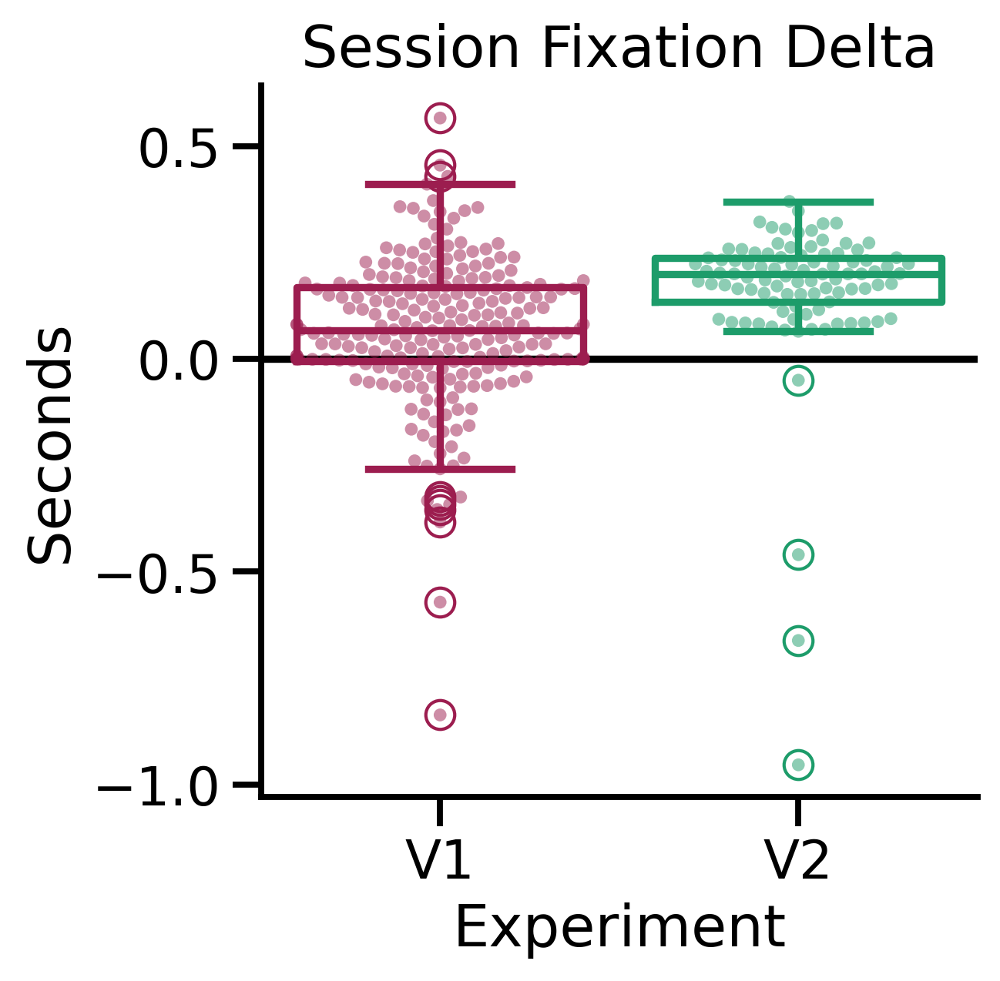

In [17]:
fig, ax = pu.make_fig("s")

# Boxplot
sns.boxplot(
    data=fix_delta_df,
    x="fix_experiment",
    y="fixation_delta",
    hue="fix_experiment",
    hue_order=["V1", "V2"],
    order=["V1", "V2"],
    palette=pu.ALPHA_PALLETTE,
    dodge=False,
    ax=ax,
    fill=False,
)

sns.swarmplot(
    data=fix_delta_df,
    x="fix_experiment",
    y="fixation_delta",
    hue="fix_experiment",
    hue_order=["V1", "V2"],
    order=["V1", "V2"],
    palette=pu.ALPHA_PALLETTE,
    dodge=False,
    ax=ax,
    alpha=0.5,
    size=4,
)

sns.despine()


ax.axhline(0, color="black", zorder=0)

_ = ax.set(ylabel="Seconds", xlabel="Experiment", title="Session Fixation Delta")

# save fig
fig.savefig(
    FIGURES_PATH + "2_3_3_fixation_delta_boxplot.png",
    dpi=300,
    bbox_inches="tight",
)

#### 2.3.4 Histogram of Fixation Delta


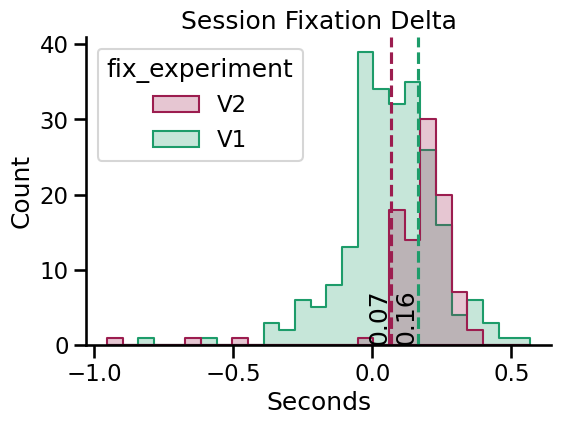

In [18]:
fig, ax = plt.subplots(figsize=(6, 4))

sns.histplot(
    data=fix_delta_df,
    x="fixation_delta",
    hue="fix_experiment",
    palette=pu.ALPHA_PALLETTE,
    ax=ax,
    element="step",
)

# mark the mean for each experiment
for ii, (exp, sub_df) in enumerate(
    fix_delta_df.groupby("fix_experiment", observed=True)
):
    mean = sub_df.fixation_delta.mean()
    ax.axvline(mean, color=pu.ALPHA_PALLETTE[ii], linestyle="--")
    ax.text(
        mean,
        0,
        f"{mean:.2f}",
        rotation=90,
        verticalalignment="bottom",
        horizontalalignment="right",
    )

sns.despine()

ax.set(xlabel="Seconds", ylabel="Count", title="Session Fixation Delta")

# save fig
fig.savefig(
    FIGURES_PATH + "2_3_4_fixation_delta_histogram.png",
    dpi=300,
    bbox_inches="tight",
)

## 2.4 V1 Growth Ceiling

Note this got a bit messy. Will want to incorporate seed setting for the simulated data. 0.2 to 0.25 is where things drop off from being net positive growth to net negative growth by the end.


In [212]:
from behav_viz.visualize.FixationGrower.df_preperation import (
    simulate_fixed_growth_w_warm_up,
    plot_v1_fixation_growth,
    prepare_v1_plot_data,
)

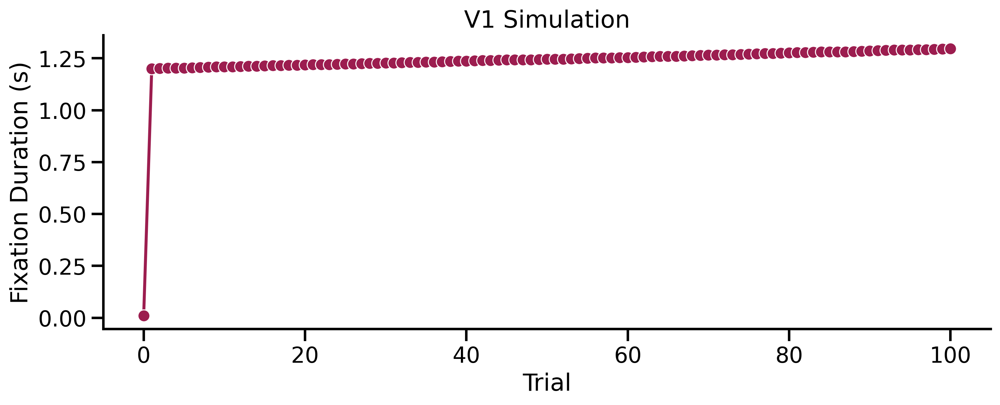

In [178]:
fix_dur, fix_durs = simulate_fixed_growth_w_warm_up(
    n_trials=100,
    warm_up_target=1.2,
    warm_up_viol_rate=0.4,
    non_warm_up_viol_rate=0.2,
    min_step_s=0.001,
    growth_frac=0.001,
    n_warm_up=1,
)

fig, ax = pu.make_fig()
sns.lineplot(
    x=range(len(fix_durs)), y=fix_durs, ax=ax, color=pu.ALPHA_V1_color, marker="o"
)
ax.set(xlabel="Trial", ylabel="Fixation Duration (s)", title="V1 Simulation")
sns.despine()

In [213]:
fixed_growth_df = (
    viz.FixationGrower.df_preperation.simulate_fixed_growth_data_w_warm_up(
        tdf, relative_stage=5, warm_up_viol_rate=0, non_warm_up_viol_rate=0
    )
)

fixed_growth_df

,date,animal_id,stage,days_relative_to_stage_5,max_fixation_dur,n_trials,n_violations,warm_up_on,violation_rate,prev_day_max_fixation_dur,simulated_max_fixation_dur,warm_up_viol_rate,non_warm_up_viol_rate
0,2024-08-01,R040,5.0,0,0.334000,440,115.0,0.0,0.261364,NaN,0.430000,0.0,0.0
1,2024-08-02,R040,6.0,1,0.558800,362,57.0,1.0,0.157459,0.334000,0.772000,0.0,0.0
2,2024-08-03,R040,7.0,2,0.682880,421,65.0,1.0,0.154394,0.558800,1.188763,0.0,0.0
3,2024-08-04,R040,7.0,3,0.793022,459,100.0,1.0,0.217865,0.682880,1.843552,0.0,0.0
4,2024-08-05,R040,7.0,4,0.963419,379,75.0,1.0,0.197889,0.793022,2.639303,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
117,2024-08-13,R056,7.0,9,1.277895,333,72.0,1.0,0.216216,1.113712,14.964001,0.0,0.0
118,2024-08-14,R056,7.0,10,1.442834,315,72.0,1.0,0.228571,1.277895,20.095582,0.0,0.0
119,2024-08-15,R056,7.0,11,1.184425,312,71.0,1.0,0.227564,1.442834,26.906129,0.0,0.0
120,2024-08-16,R056,7.0,12,1.265053,303,58.0,1.0,0.191419,1.184425,35.702214,0.0,0.0


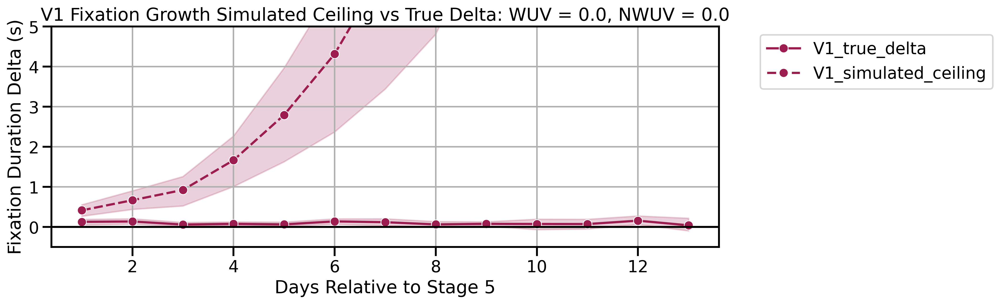

In [283]:
# After running the simulation
fixed_growth_df = (
    viz.FixationGrower.df_preperation.simulate_fixed_growth_data_w_warm_up(
        tdf, relative_stage=5, warm_up_viol_rate=0, non_warm_up_viol_rate=0
    )
)

# Prepare plot data
v1_plot_df = prepare_v1_plot_data(fixed_growth_df)


# Plot
fig, ax = plot_v1_fixation_growth(v1_plot_df, fixed_growth_df, ylim=(-0.5, 5))

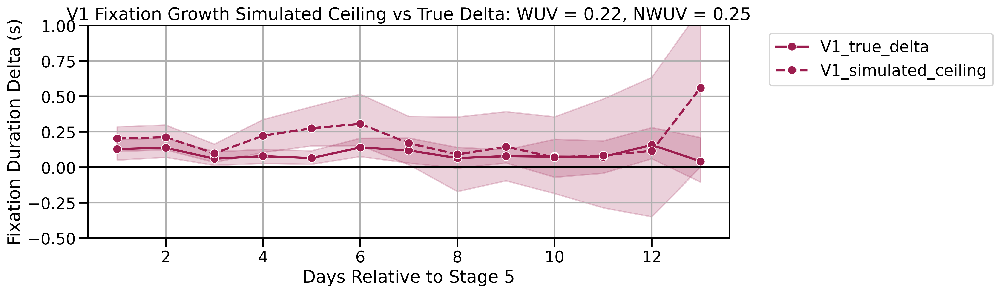

In [282]:
# After running the simulation
fixed_growth_df = (
    viz.FixationGrower.df_preperation.simulate_fixed_growth_data_w_warm_up(
        tdf, relative_stage=5, warm_up_viol_rate=0.22, non_warm_up_viol_rate=0.25
    )
)

# Prepare plot data
v1_plot_df = prepare_v1_plot_data(fixed_growth_df)

# Plot
fig, ax = plot_v1_fixation_growth(v1_plot_df, fixed_growth_df, ylim=(-0.5, 1))

In [269]:
fix_delta_df = viz.FixationGrower.df_preperation.make_fixation_delta_df(
    tdf.query("stage < 8").copy()
)

fix_delta_df = fix_delta_df.query("days_relative_to_stage_5 < 14")
shared_cols = [
    "date",
    "animal_id",
    "stage",
    "days_relative_to_stage_5",
    "fix_experiment",
]
fixed_growth_df["fix_experiment"] = "V1"

plot_df = pd.merge(
    fix_delta_df,
    fixed_growth_df[shared_cols + ["V1_simulated_ceiling"]],
    on=shared_cols,
    how="left",
)
plot_df.rename(
    columns={
        "fixation_delta": "true_delta",
        "V1_simulated_ceiling": "simulated_ceiling",
    },
    inplace=True,
)

melted_plot_df = plot_df.melt(
    id_vars=shared_cols,
    value_vars=["true_delta", "simulated_ceiling"],
    var_name="delta_type",
    value_name="delta",
)

melted_plot_df.head()

,date,animal_id,stage,days_relative_to_stage_5,fix_experiment,delta_type,delta
0,2024-07-30,R041,5.0,0,V2,true_delta,NaN
1,2024-07-30,R042,5.0,0,V1,true_delta,NaN
2,2024-07-30,R043,5.0,0,V2,true_delta,NaN
3,2024-07-30,R045,5.0,0,V2,true_delta,NaN
4,2024-07-30,R046,5.0,0,V1,true_delta,NaN


[(-0.5, 0.4)]

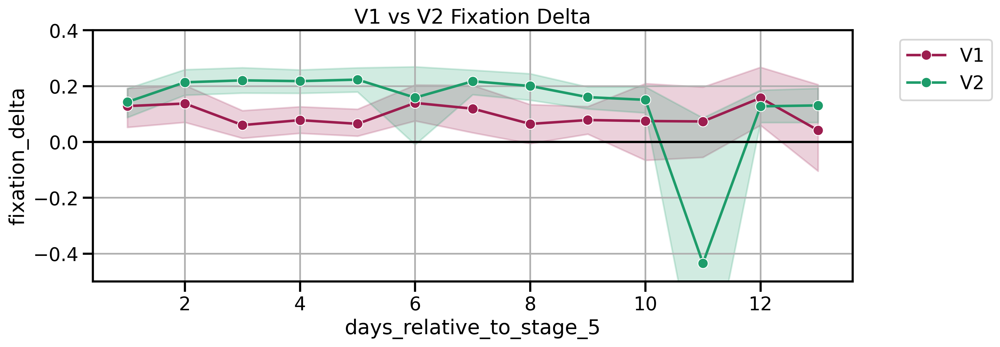

In [254]:
fig, ax = pu.make_fig()

sns.lineplot(
    data=fix_delta_df,
    x="days_relative_to_stage_5",
    y="fixation_delta",
    hue="fix_experiment",
    hue_order=["V1", "V2"],
    palette=pu.ALPHA_PALLETTE,
    marker="o",
    ax=ax,
)
ax.grid()
ax.set_title(f"V1 vs V2 Fixation Delta")
ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
ax.axhline(0, color="k", lw=2)
ax.set(ylim=(-0.5, 0.4))

[(-0.5, 0.7)]

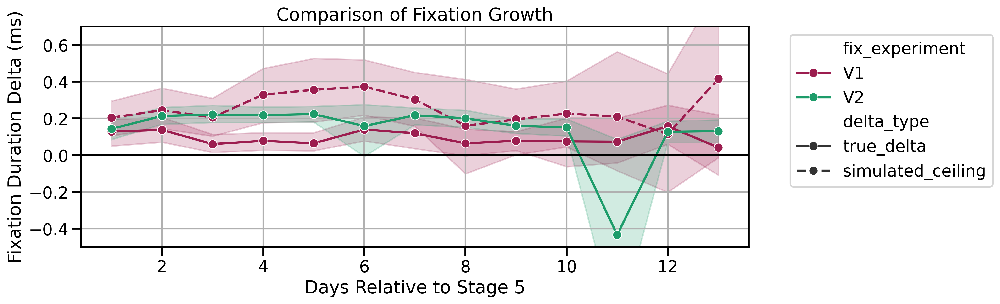

In [270]:
fig, ax = pu.make_fig()
sns.lineplot(
    data=melted_plot_df,
    x="days_relative_to_stage_5",
    y="delta",
    hue="fix_experiment",
    hue_order=["V1", "V2"],
    palette=pu.ALPHA_PALLETTE,
    marker="o",
    style="delta_type",
    ax=ax,
)
ax.axhline(0, color="k", lw=2)
ax.grid()
ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left")

ax.set(
    xlabel="Days Relative to Stage 5",
    ylabel="Fixation Duration Delta (ms)",
    title="Comparison of Fixation Growth",
)
ax.set(ylim=(-0.5, 0.7))

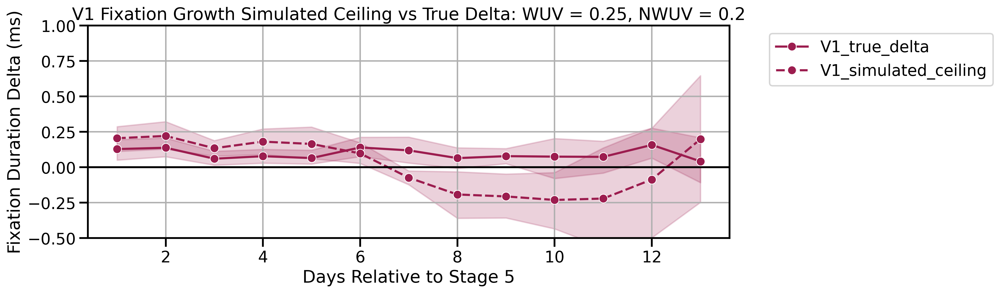

In [224]:
# After running the simulation
fixed_growth_df = (
    viz.FixationGrower.df_preperation.simulate_fixed_growth_data_w_warm_up(
        tdf, relative_stage=5, warm_up_viol_rate=0.25, non_warm_up_viol_rate=0.2
    )
)

# Prepare plot data
v1_plot_df = prepare_v1_plot_data(fixed_growth_df)

# Plot
fig, ax = plot_v1_fixation_growth(v1_plot_df, fixed_growth_df, ylim=(-0.5, 1))

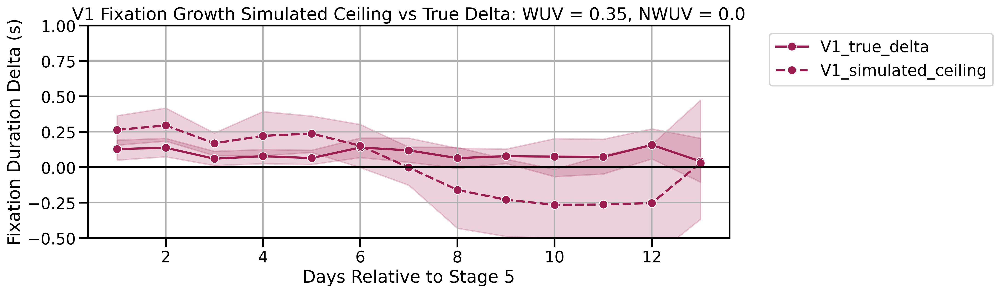

In [275]:
# After running the simulation
fixed_growth_df = (
    viz.FixationGrower.df_preperation.simulate_fixed_growth_data_w_warm_up(
        tdf, relative_stage=5, warm_up_viol_rate=0.35, non_warm_up_viol_rate=0
    )
)

# Prepare plot data
v1_plot_df = prepare_v1_plot_data(fixed_growth_df)

# Plot
fig, ax = plot_v1_fixation_growth(v1_plot_df, fixed_growth_df, ylim=(-0.5, 1))

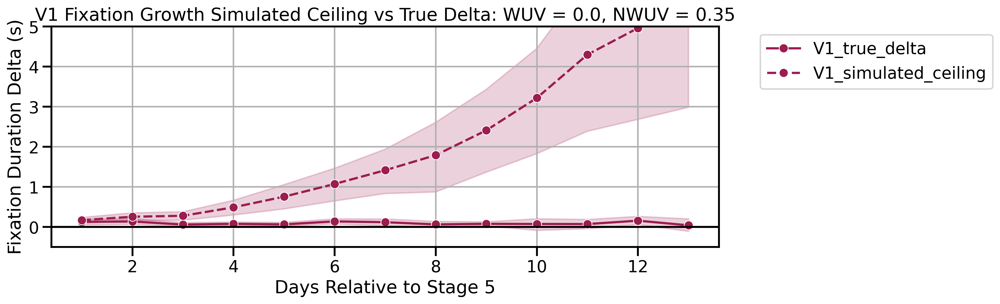

In [274]:
# After running the simulation
fixed_growth_df = (
    viz.FixationGrower.df_preperation.simulate_fixed_growth_data_w_warm_up(
        tdf, relative_stage=5, warm_up_viol_rate=0, non_warm_up_viol_rate=0.35
    )
)

# Prepare plot data
v1_plot_df = prepare_v1_plot_data(fixed_growth_df)

# Plot
fig, ax = plot_v1_fixation_growth(v1_plot_df, fixed_growth_df, ylim=(-0.5, 5))

# 3. Quality


## 3.1 Failed Fixation Rate by Stage


In [19]:
failed_fix_df = viz.FixationGrower.df_preperation.compute_failed_fixation_rate_df(
    tdf.query("stage >=5")
)

type_map = {"violation": "Penalty On", "by_poke": "Penalty Off"}

failed_fix_df.query("type != 'by_trial'", inplace=True)
failed_fix_df["type"] = failed_fix_df.type.map(type_map)

failed_fix_df.head()

,animal_id,stage,fix_experiment,date,type,failure_rate
0,R040,5.0,V1,2024-08-01,Penalty On,0.261364
1,R040,6.0,V1,2024-08-02,Penalty On,0.157459
2,R040,7.0,V1,2024-08-03,Penalty On,0.154394
3,R040,7.0,V1,2024-08-04,Penalty On,0.217865
4,R040,7.0,V1,2024-08-05,Penalty On,0.197889


In [20]:
failed_fix_df = make_failed_fix_df_by_penalty_type(tdf)

failed_fix_df.to_csv(DATA_PATH + "3_1_alpha_failed_fix_df.csv", index=False)

### 3.1.1 Fixation Growth Stages


#### Boxplots


In [21]:
xlabel = ""
ylim = (-0.05, 1)
ylabel = "Failure Rate"

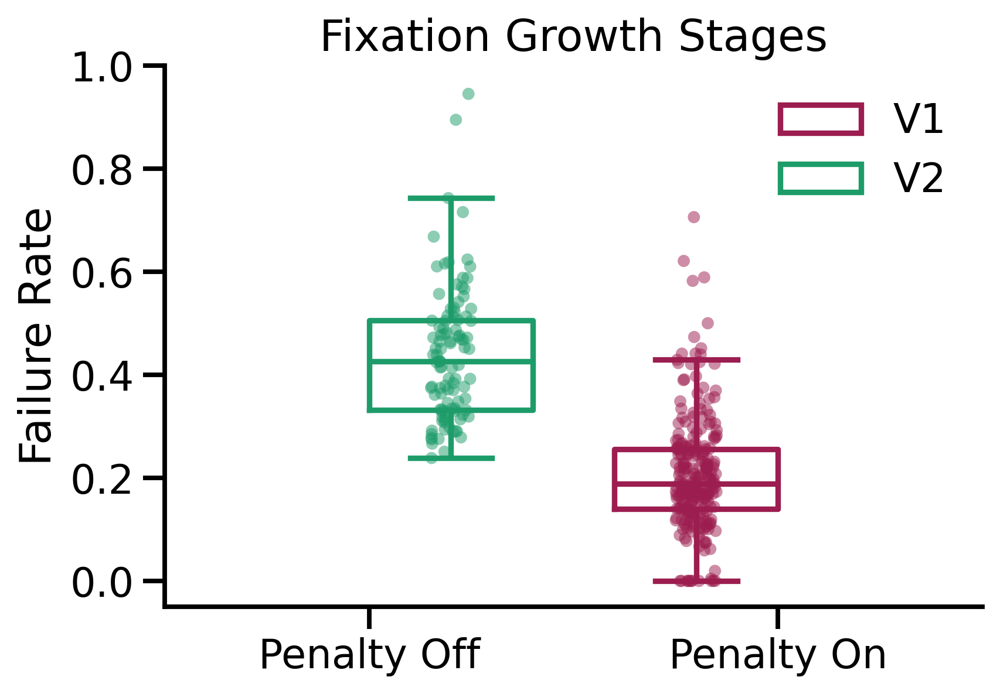

In [22]:
fig, ax = pu.make_fig("m")
box_strip_v1_vs_v2(
    failed_fix_df.query("stage in @growing_stages"),
    x="type",
    y="failure_rate",
    ax=ax,
    order=["Penalty Off", "Penalty On"],
)

_ = ax.set(ylabel=ylabel, xlabel=xlabel, ylim=ylim, title="Fixation Growth Stages")

# save fig
fig.savefig(
    FIGURES_PATH + "3_3_1_fixation_growth_stages_failure_rate_boxplot.png",
    dpi=300,
    bbox_inches="tight",
)

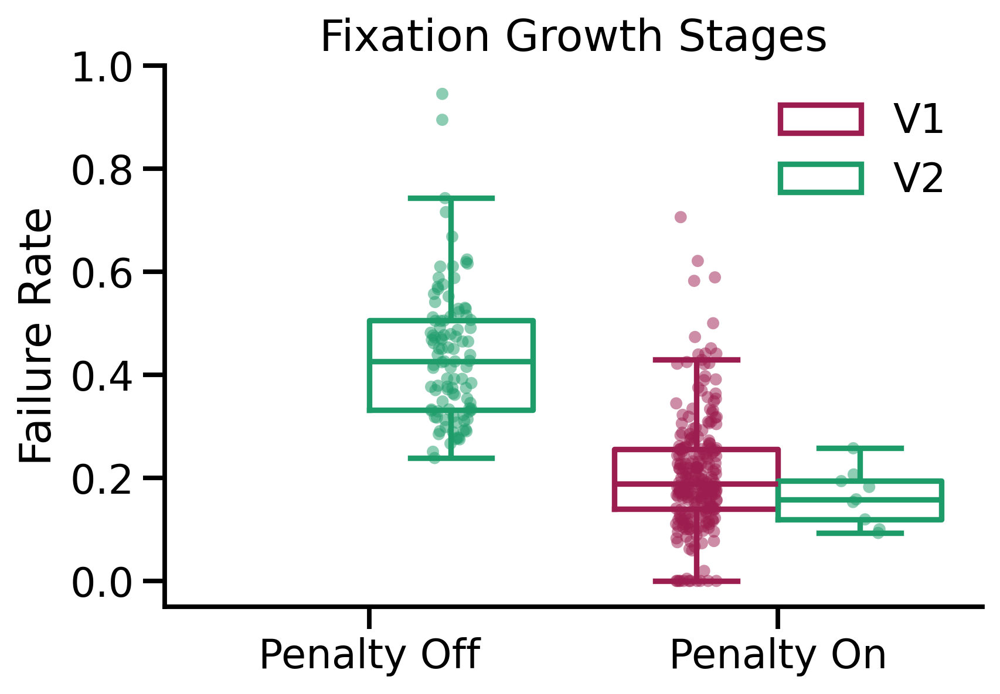

In [23]:
fig, ax = pu.make_fig("m")
box_strip_v1_vs_v2(
    failed_fix_df.query("stage >= 5 and stage <=8"),
    x="type",
    y="failure_rate",
    order=["Penalty Off", "Penalty On"],
    ax=ax,
)

_ = ax.set(ylabel=ylabel, xlabel=xlabel, ylim=ylim, title="Fixation Growth Stages")

fig.savefig(
    FIGURES_PATH + "3_3_1_fixation_pre_probe_failure_rate_boxplot.png",
    dpi=300,
    bbox_inches="tight",
)

#### Overdays


In [24]:
xlim = (0, 60)
xlabel = "Days in Fixation Growth"

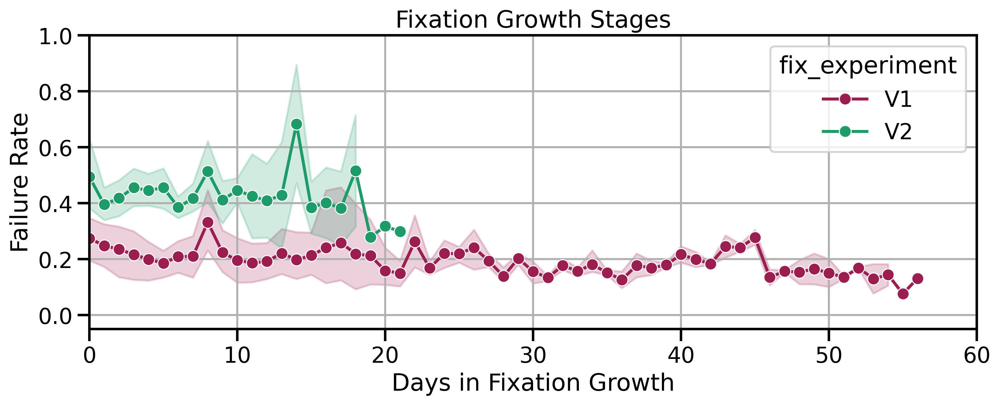

In [25]:
fig, ax = pu.make_fig()
viz.FixationGrower.exp_compare_alpha.plot_failed_fixation_rate_compare_experiment(
    tdf, plot_individuals=False, min_stage=5, max_stage=7, ax=ax
)
_ = ax.set(
    ylim=ylim,
    xlim=xlim,
    title="Fixation Growth Stages",
    ylabel=ylabel,
    xlabel=xlabel,
)

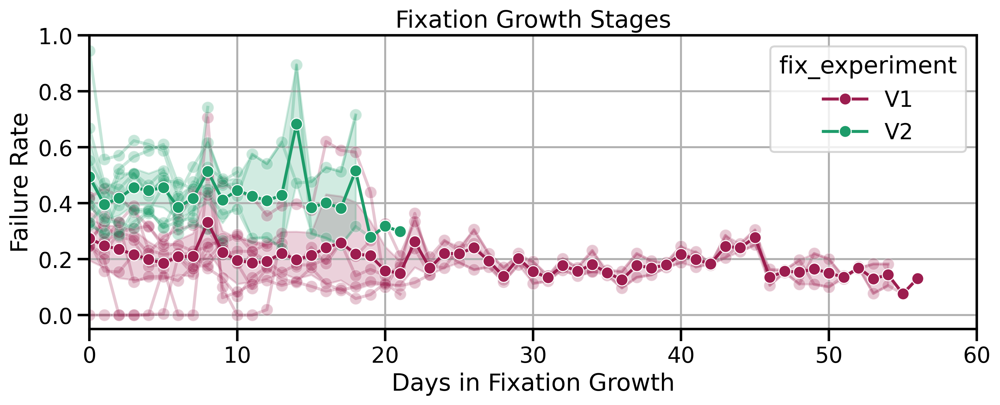

In [26]:
fig, ax = pu.make_fig()
viz.FixationGrower.exp_compare_alpha.plot_failed_fixation_rate_compare_experiment(
    tdf, plot_individuals=True, min_stage=5, max_stage=7, ax=ax
)
_ = ax.set(
    ylim=ylim, xlim=xlim, xlabel=xlabel, ylabel=ylabel, title="Fixation Growth Stages"
)

#### Histogram


Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "/Users/jessbreda/anaconda3/envs/behav_viz/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3526, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/var/folders/__/8jn6qz211155h1xb451s5zcr0000gn/T/ipykernel_27311/1869520077.py", line 1, in <module>
    viz.FixationGrower.exp_compare_alpha.plot_failed_fixation_histogram_compare_experiment(
  File "/Users/jessbreda/Desktop/github/jbreda_animal_training/src/behav_viz/visualize/FixationGrower/exp_compare_alpha.py", line 238, in plot_failed_fixation_histogram_compare_experiment
    viz.multianimal_plots.plot_failed_fixation_histogram(
  File "/Users/jessbreda/Desktop/github/jbreda_animal_training/src/behav_viz/visualize/multianimal_plots.py", line 161, in plot_failed_fixation_histogram
    plot_failed_fix_median_line(ax, failed_fix_rates_df, show_median_text, **kwargs)
  File "/Users/jessbreda/Desktop/github/jbreda_animal_training/src/behav_viz/visualize/m

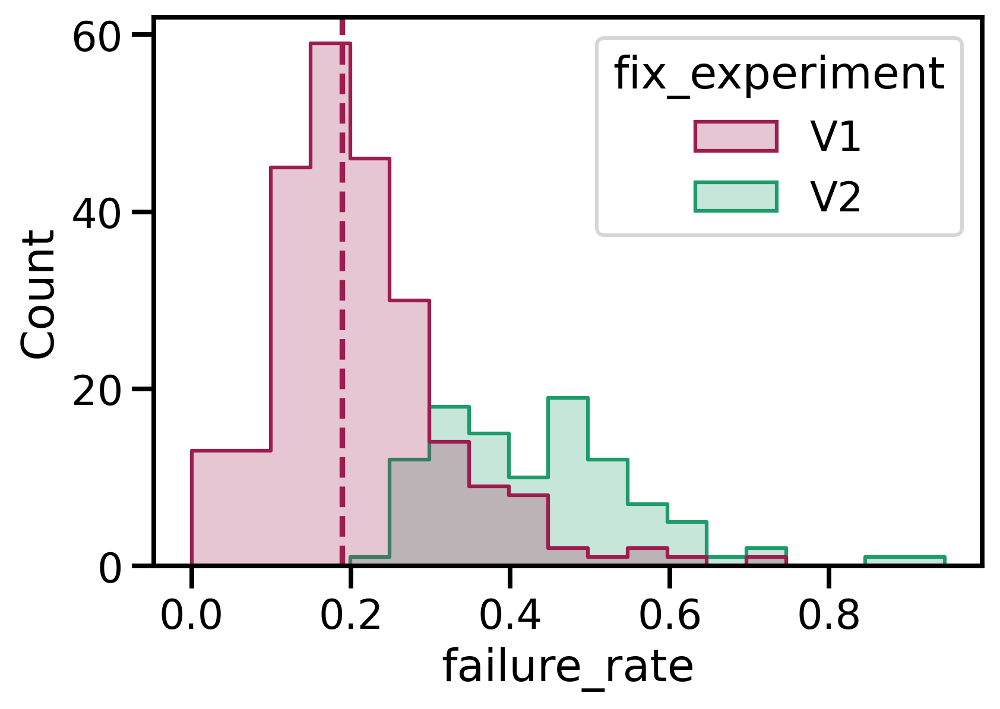

In [29]:
viz.FixationGrower.exp_compare_alpha.plot_failed_fixation_histogram_compare_experiment(
    tdf,
    min_stage=5,
    max_stage=7,
    settling_in_type="by_poke",
    title="Fixation Growth Stages",
)

### 3.1.2 Stage 7 -> 8 Transition


In [ ]:
v2_penalty_on_df = failed_fix_df.query("fix_experiment == 'V2'").copy()
v2_penalty_on_df = viz.df_preperation.compute_days_relative_to_stage(
    failed_fix_df, 8
).reset_index()

[Text(0, 0.5, 'Failure Rate'),
 Text(0.5, 0, 'Days Relative to Penalty On'),
 Text(0.5, 1.0, 'V2 Penalty'),
 (-0.05, 1.0)]

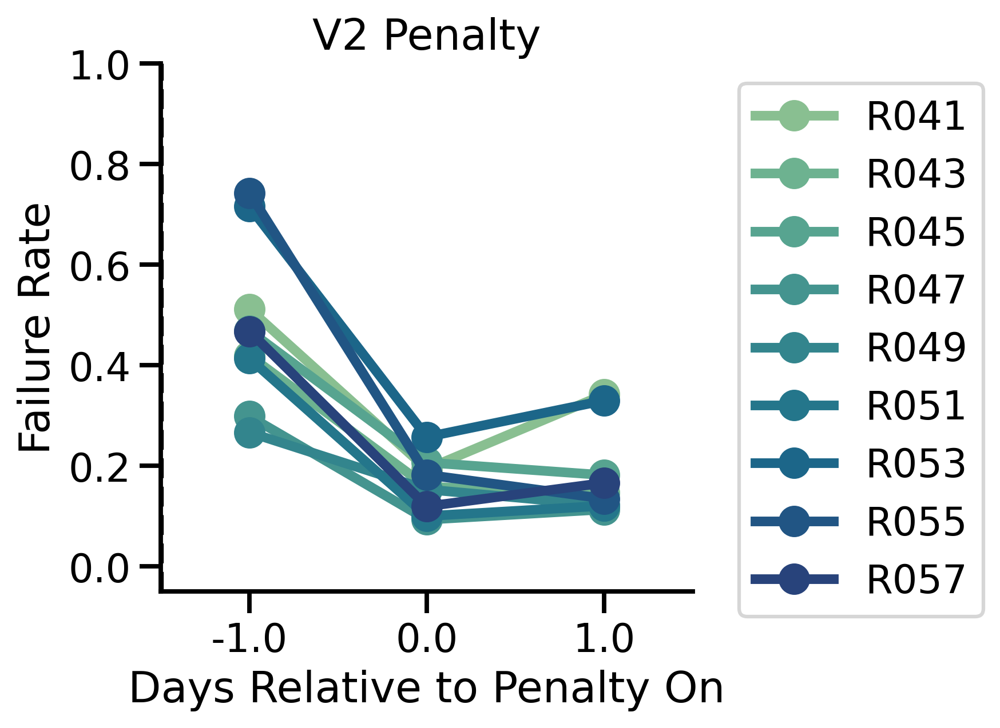

In [ ]:
fig, ax = pu.make_fig("s")
sns.despine()
day_range = [-1, 1]

plot_df = v2_penalty_on_df.query(
    "days_relative_to_stage_8 >= @day_range[0] and days_relative_to_stage_8 <= @day_range[1]"
)
sns.pointplot(
    data=plot_df,
    x="days_relative_to_stage_8",
    y="failure_rate",
    hue="animal_id",
    palette=pu.ALPHA_V2_palette,
    ax=ax,
)
ax.axvline(-0.5, color="black", linestyle="--")
ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left")

ax.set(
    ylabel=ylabel,
    xlabel="Days Relative to Penalty On",
    title="V2 Penalty",
    ylim=ylim,
)

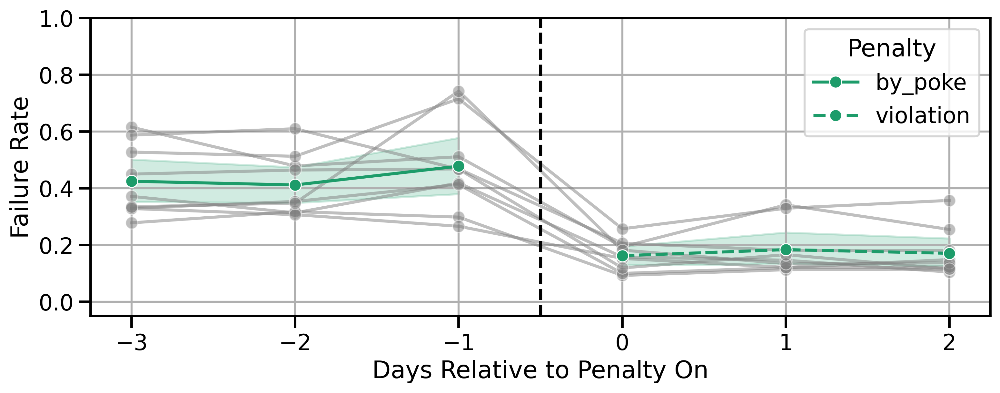

In [ ]:
fig, ax = pu.make_fig()
viz.FixationGrower.exp_compare_alpha.plot_failed_fixation_rate_turn_penalty_on(
    tdf, max_stage=9, day_range=(-3, 2), style="type", ax=ax
)

ax.legend(title="Penalty")

_ = ax.set(ylabel=ylabel, xlabel="Days Relative to Penalty On", ylim=ylim)

### 3.1.3 Probe Stage Violation Rates


#### Boxplots


In [37]:
ylim = (-0.05, 0.5)

probe_failed_fix = failed_fix_df.query("stage in @probe_stages").copy()

/var/folders/__/8jn6qz211155h1xb451s5zcr0000gn/T/ipykernel_23724/3590971558.py:17: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Stable\nDelay", "Random\nDelay"])


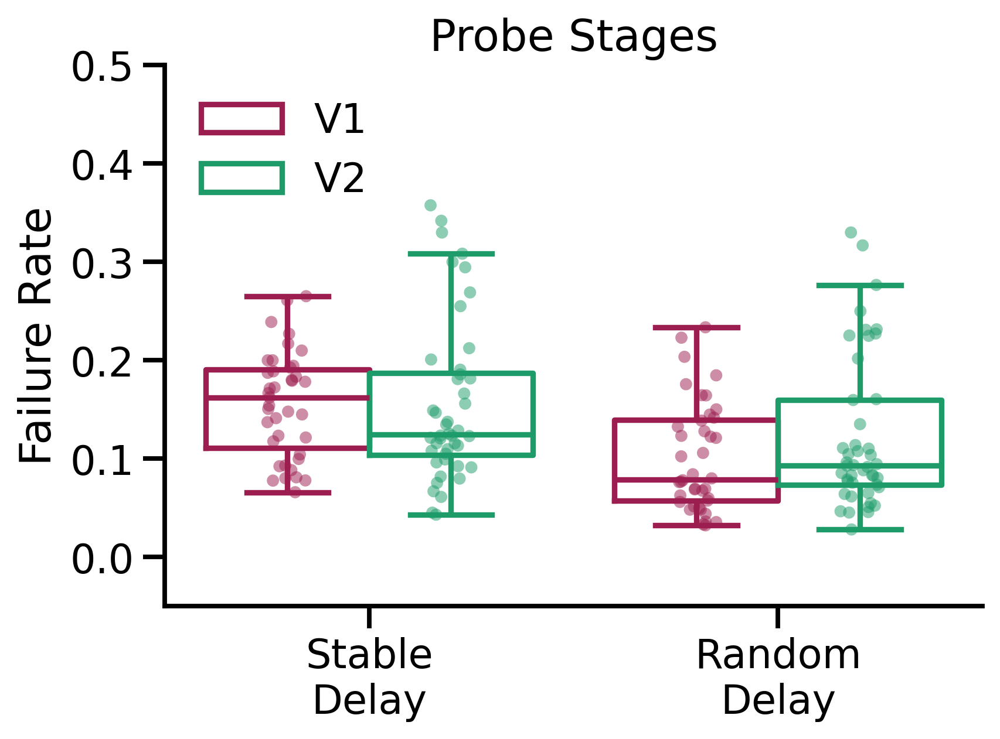

In [ ]:
fig, ax = pu.make_fig("m")
box_strip_v1_vs_v2(
    probe_failed_fix,
    order=None,
    x="stage",
    y="failure_rate",
    ax=ax,
)

_ = ax.set(
    xlabel="",
    ylabel=ylabel,
    title="Probe Stages",
    ylim=ylim,
)

ax.set_xticklabels(["Stable\nDelay", "Random\nDelay"])

ax.legend(title=None, frameon=False, loc="upper left")

# save fig
fig.savefig(
    FIGURES_PATH + "3_1_3_probe_stages_failure_rate_by_stage_boxplot.png",
    dpi=300,
    bbox_inches="tight",
)

/var/folders/__/8jn6qz211155h1xb451s5zcr0000gn/T/ipykernel_23724/2854241508.py:44: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  round(medians[xtick], 2),


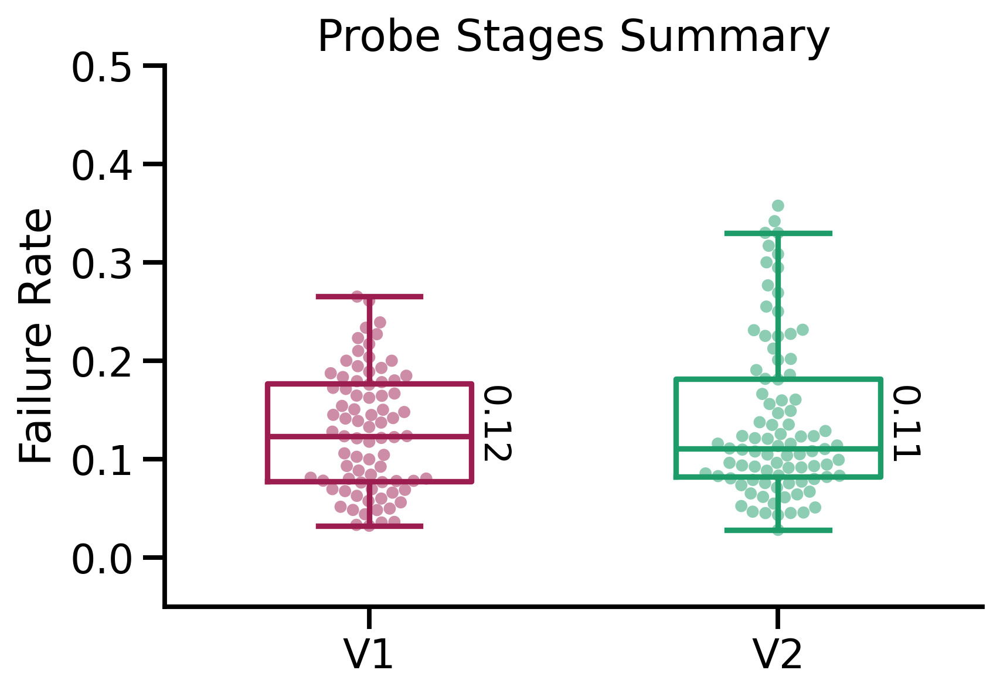

In [ ]:
fig, ax = pu.make_fig("m")
sns.despine()

sns.boxplot(
    data=probe_failed_fix,
    x="fix_experiment",
    y="failure_rate",
    hue="fix_experiment",
    palette=pu.ALPHA_PALLETTE,
    ax=ax,
    fill=None,
    showfliers=False,
    width=0.5,
)

sns.swarmplot(
    data=probe_failed_fix,
    x="fix_experiment",
    y="failure_rate",
    hue="fix_experiment",
    palette=pu.ALPHA_PALLETTE,
    ax=ax,
    legend=False,
    alpha=0.5,
)

_ = ax.set(
    xlabel="",
    ylabel=ylabel,
    title="Probe Stages Summary",
    ylim=ylim,
)

# print median for each group on box plot in vertical text next to the boxplot in black
medians = probe_failed_fix.groupby(["fix_experiment"])["failure_rate"].median()
# Step 2: Calculate a small offset to ensure the text doesn't overlap with the boxplot
vertical_offset = probe_failed_fix["failure_rate"].median() * 0.05

# Step 3: Plot the medians on the boxplot with 90-degree rotation
for xtick in ax.get_xticks():
    ax.text(
        xtick + 0.3,  # Slightly adjust the x position to place text on the edge
        0.1,
        round(medians[xtick], 2),
        horizontalalignment="center",
        size="small",
        color="black",
        rotation=270,  # Rotate the text 90 degrees
    )

# save fig
fig.savefig(
    FIGURES_PATH + "3_1_3_probe_stages_failure_rate_boxplot.png",
    dpi=300,
    bbox_inches="tight",
)

#### Histograms


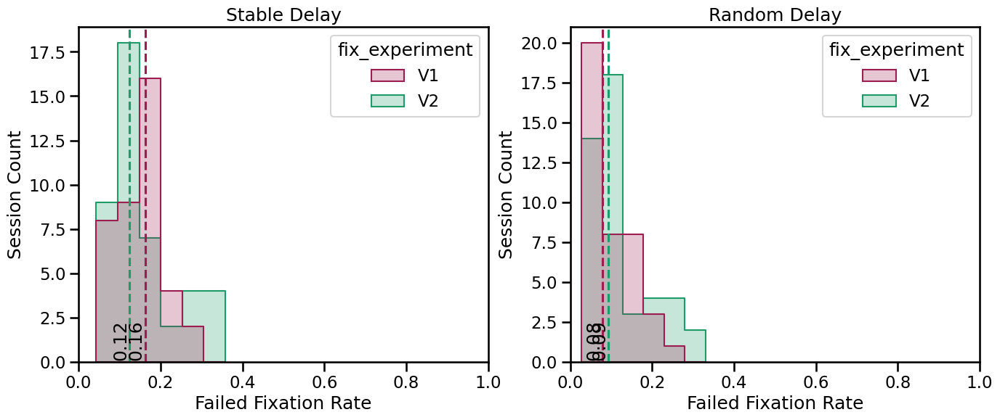

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

viz.FixationGrower.exp_compare_alpha.plot_failed_fixation_histogram_compare_experiment(
    tdf, min_stage=9, max_stage=9, title="Stable Delay", ax=ax[0]
)

viz.FixationGrower.exp_compare_alpha.plot_failed_fixation_histogram_compare_experiment(
    tdf, min_stage=10, max_stage=10, title="Random Delay", ax=ax[1]
)

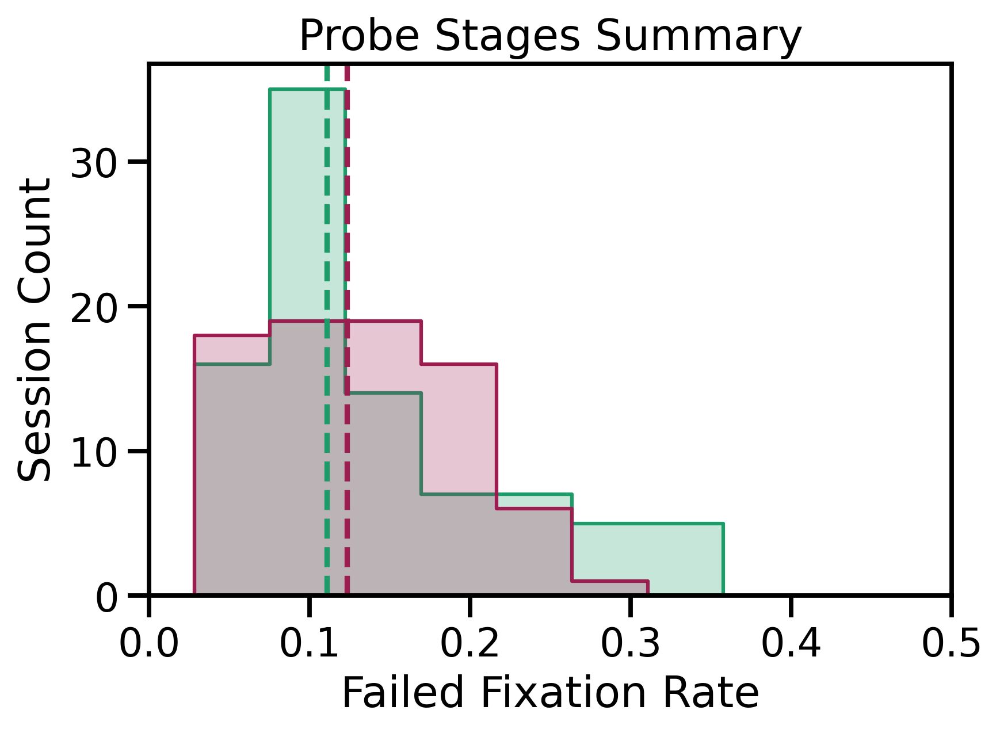

In [33]:
fig, ax = pu.make_fig("m")
viz.FixationGrower.exp_compare_alpha.plot_failed_fixation_histogram_compare_experiment(
    tdf,
    min_stage=9,
    max_stage=10,
    title="Probe Stages Summary",
    ax=ax,
    show_median_text=False,
)

ax.set(xlim=(0.0, 0.5))
ax.get_legend().remove()

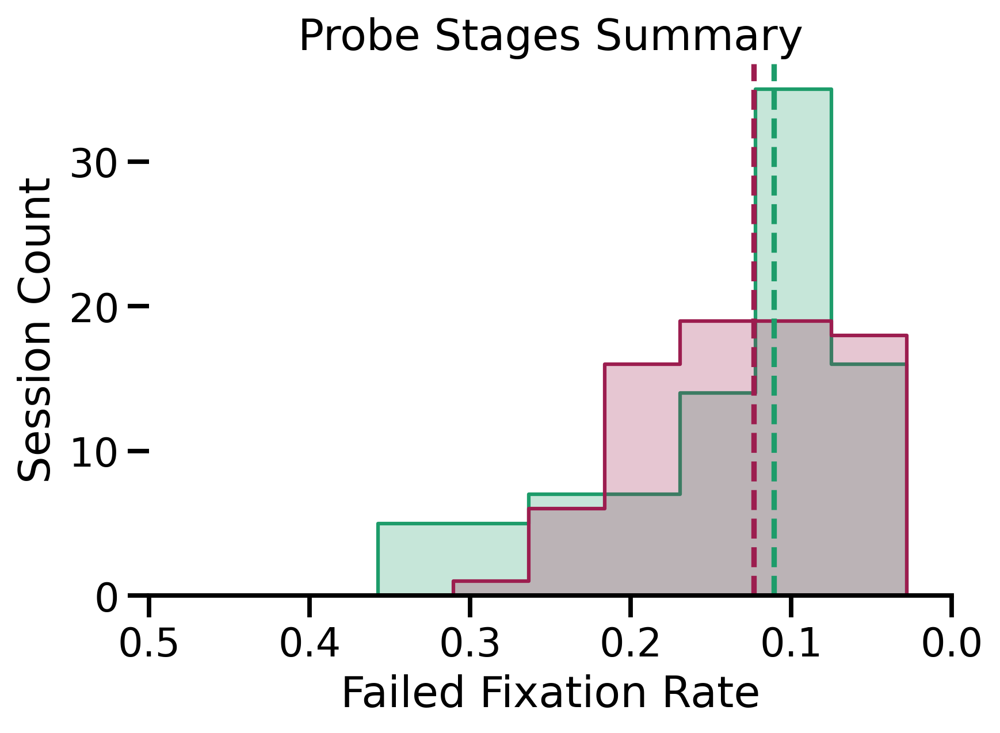

In [32]:
fig, ax = pu.make_fig("m")
viz.FixationGrower.exp_compare_alpha.plot_failed_fixation_histogram_compare_experiment(
    tdf,
    min_stage=9,
    max_stage=10,
    title="Probe Stages Summary",
    ax=ax,
    show_median_text=False,
)

ax.set(xlim=(0.0, 0.5))
ax.get_legend().remove()

# invert the x axis
ax.invert_xaxis()
sns.despine(left=True)

# save fig
fig.savefig(
    FIGURES_PATH + "3_1_3_probe_stages_failure_rate_lateral_histogram.png",
    dpi=300,
    bbox_inches="tight",
)

#### Over Days


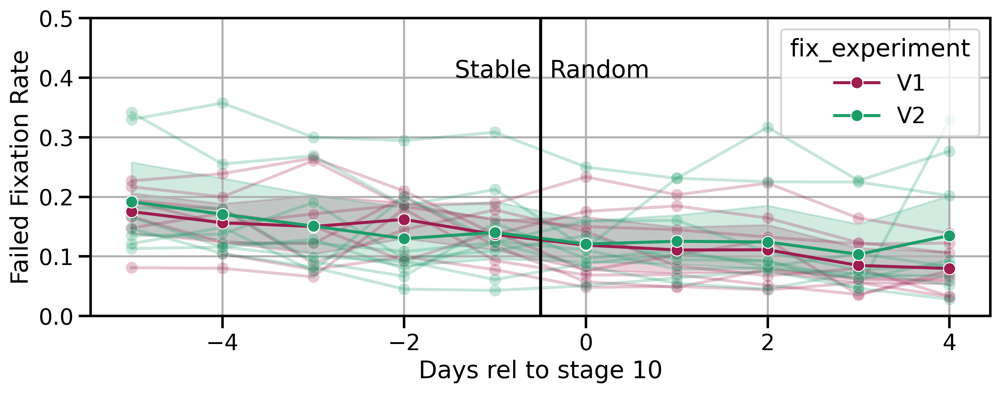

In [35]:
fig, ax = pu.make_fig()
viz.FixationGrower.exp_compare_alpha.plot_failed_fixation_rate_compare_experiment(
    tdf, plot_individuals=True, min_stage=9, max_stage=10, relative_to_stage=10, ax=ax
)

ax.grid()

ax.axvline(-0.5, color="black")
_ = ax.text(-0.4, 0.4, "Random", horizontalalignment="left")
_ = ax.text(-0.6, 0.4, "Stable", horizontalalignment="right")

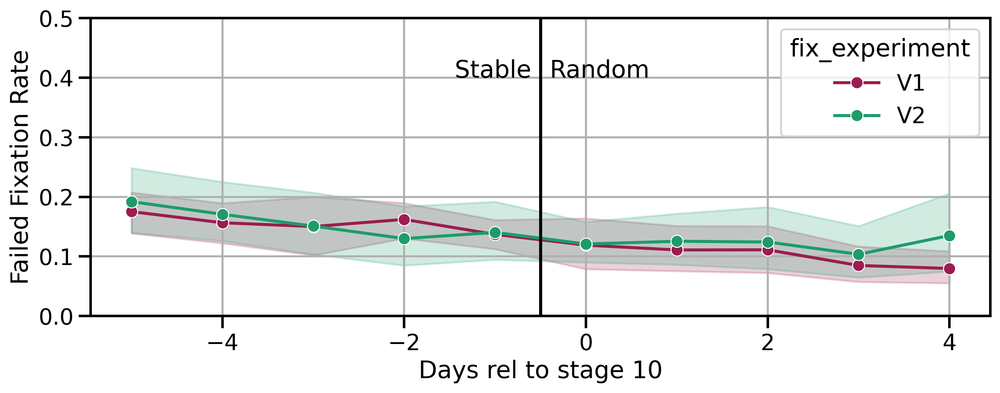

In [34]:
fig, ax = pu.make_fig()
viz.FixationGrower.exp_compare_alpha.plot_failed_fixation_rate_compare_experiment(
    tdf, plot_individuals=False, min_stage=9, max_stage=10, relative_to_stage=10, ax=ax
)

ax.axvline(-0.5, color="black")
_ = ax.text(-0.4, 0.4, "Random", horizontalalignment="left")
_ = ax.text(-0.6, 0.4, "Stable", horizontalalignment="right")

### 3.1.4 Violation Rates by Growth Time


In [38]:
target_fix_df = viz.FixationGrower.df_preperation.compute_days_to_target_fix_df(tdf)

target_fix_df.rename(columns={"days_to_target": "days"}, inplace=True)
target_fix_df["reached_target"] = True

viol_rate_by_growth_time_df = pd.merge(
    target_fix_df[["animal_id", "fix_experiment", "days"]],
    probe_failed_fix[["animal_id", "fix_experiment", "date", "failure_rate"]],
    on=["animal_id", "fix_experiment"],
)


viol_rate_by_growth_time_df.to_csv(
    DATA_PATH + "3_1_alpha_viol_rate_by_growth_time_df.csv", index=False
)
viol_rate_by_growth_time_df.head()

,animal_id,fix_experiment,days,date,failure_rate
0,R040,V1,13,2024-08-14,0.216981
1,R040,V1,13,2024-08-15,0.200000
2,R040,V1,13,2024-08-16,0.261017
3,R040,V1,13,2024-08-17,0.183381
4,R040,V1,13,2024-08-18,0.162319


In [153]:
target_fix_df

,animal_id,fix_experiment,days,reached_target
0,R040,V1,13,True
1,R041,V2,11,True
2,R042,V1,12,True
3,R043,V2,6,True
4,R045,V2,11,True
5,R046,V1,13,True
6,R047,V2,22,True
7,R048,V1,35,True
8,R049,V2,10,True
9,R050,V1,22,True


In [154]:
viol_rate_by_growth_time_df.groupby(["animal_id"]).days.max()

animal_id
R040    13
R041    11
R042    12
R043     6
R045    11
R046    13
R047    22
R048    35
R049    10
R050    22
R051     8
R052    57
R053    19
R054    24
R055     9
R056    55
R057     7
Name: days, dtype: int64

In [155]:
fig, ax = pu.make_fig("m")
sns.lineplot(
    data=viol_rate_by_growth_time_df,
    x="days",
    y="failure_rate",
    hue="fix_experiment",
    palette=pu.ALPHA_PALLETTE,
    hue_order=["V1", "V2"],
    marker="o",
    style=
    linestyle="",
    err_style="bars",
    alpha=
    ax=ax,
)

_ = ax.set(
    xlim=(0, 60),
    ylim=(0, 0.4),
    xlabel="Days to Target",
    ylabel="Probe Failure Rate",
)

sns.despine()
ax.legend(title=None, frameon=False)

SyntaxError: invalid syntax (3153926256.py, line 11)

/Users/jessbreda/anaconda3/envs/behav_viz/lib/python3.10/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)
/Users/jessbreda/anaconda3/envs/behav_viz/lib/python3.10/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)
/Users/jessbreda/anaconda3/envs/behav_viz/lib/python3.10/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)
/Users/jessbreda/anaconda3/envs/behav_viz/lib/python3.10/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in

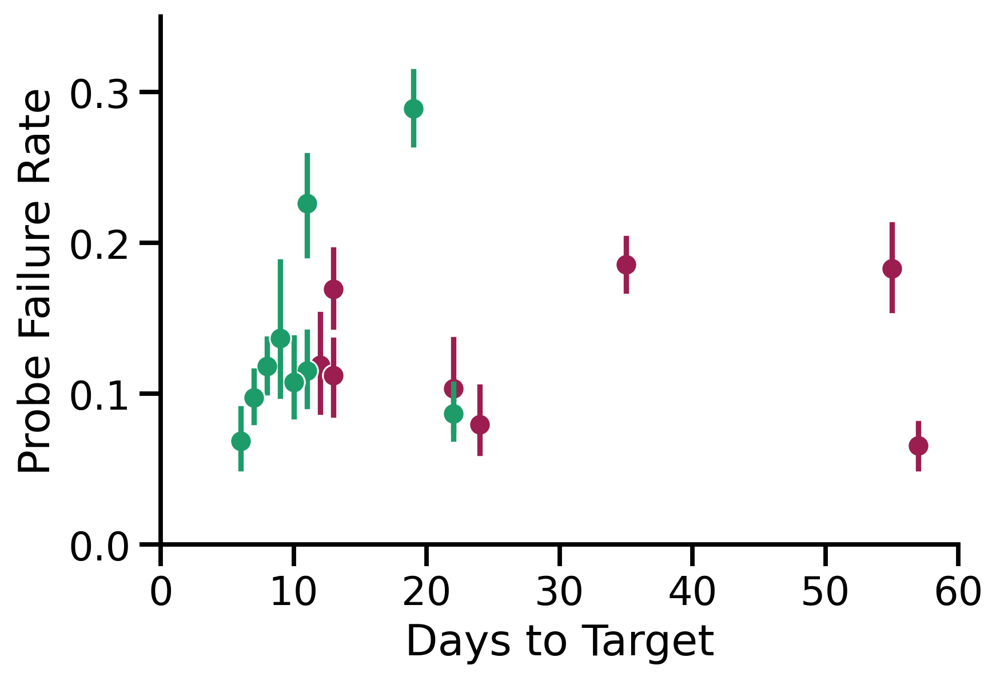

In [162]:
fig, ax = pu.make_fig("m")
sns.lineplot(
    data=viol_rate_by_growth_time_df,
    x="days",
    y="failure_rate",
    hue="fix_experiment",
    palette=pu.ALPHA_PALLETTE,
    hue_order=["V1", "V2"],
    marker="o",
    style="animal_id",
    linestyle="",
    err_style="bars",
    ax=ax,
)

_ = ax.set(
    xlim=(0, 60),
    ylim=(0, 0.35),
    xlabel="Days to Target",
    ylabel="Probe Failure Rate",
)

sns.despine()
# ax.legend(title=None, frameon=False)

ax.get_legend().remove()

## 3.2 Other Perf Metrics


### 3.2.1 Trial Counts


In [ ]:
cpoke_learning_tdf = tdf.query("stage >= 5 and stage <9").copy()
probe_tdf = tdf.query("stage in @probe_stages").copy()

In [ ]:
cpoke_trial_counts = (
    cpoke_learning_tdf.groupby(
        ["animal_id", "fix_experiment", "stage", "date"], observed=True
    )
    .trial.max()
    .reset_index()
)

cpoke_trial_counts.to_csv(
    DATA_PATH + "3_2_alpha_cpoke_learning_trial_counts.csv", index=False
)
probe_trial_counts = (
    probe_tdf.groupby(["animal_id", "fix_experiment", "stage", "date"], observed=True)
    .trial.max()
    .reset_index()
)

probe_trial_counts.to_csv(DATA_PATH + "3_2_alpha_probe_trial_counts.csv", index=False)

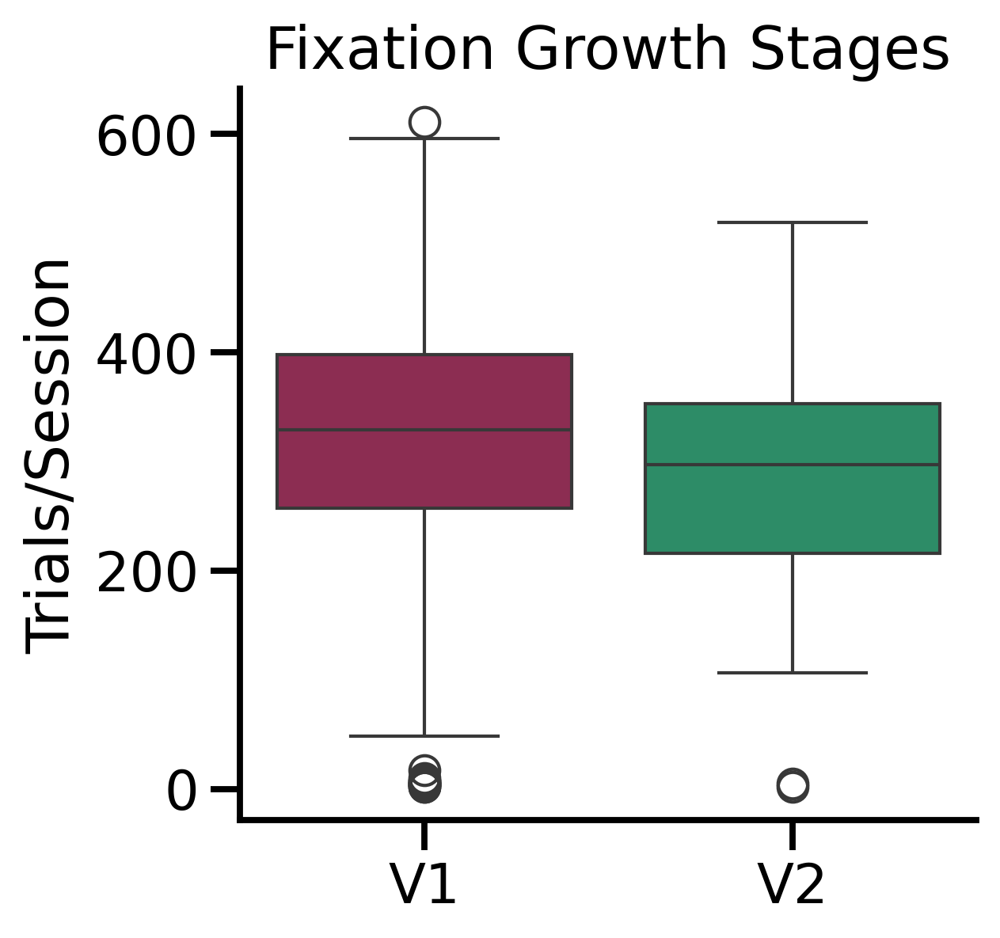

In [ ]:
fig, ax = pu.make_fig("s")
sns.boxplot(
    data=cpoke_trial_counts,
    x="fix_experiment",
    y="trial",
    hue="fix_experiment",
    palette=pu.ALPHA_PALLETTE,
)

sns.despine()
_ = ax.set(
    xlabel="",
    ylabel="Trials/Session",
    title="Fixation Growth Stages",
)

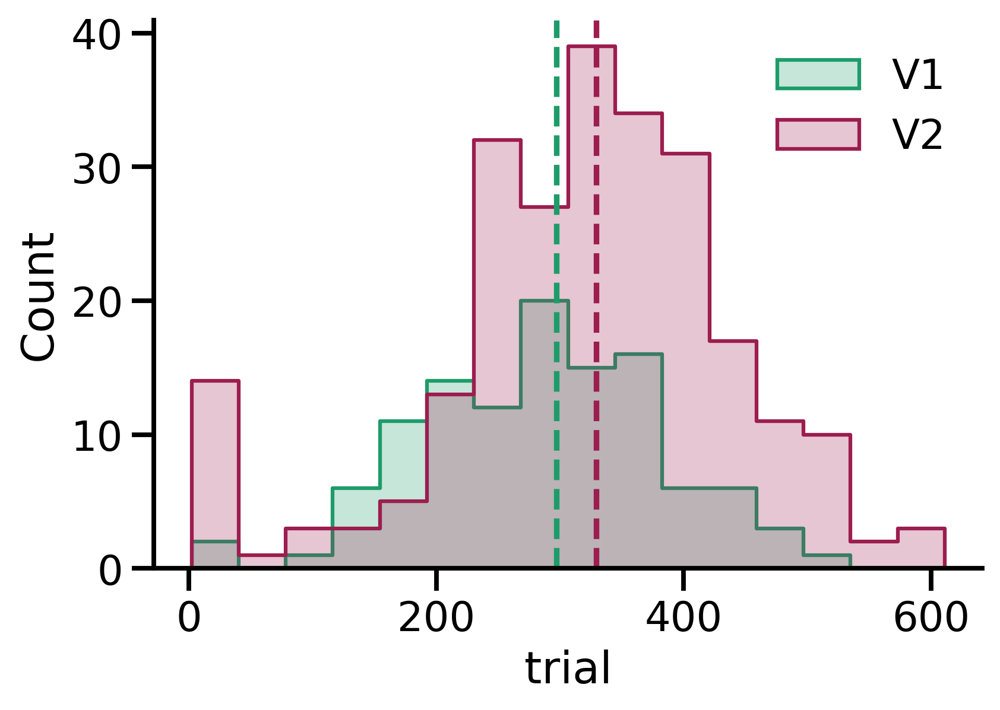

In [ ]:
fig, ax = pu.make_fig("m")
sns.histplot(
    data=cpoke_trial_counts,
    x="trial",
    hue="fix_experiment",
    palette=pu.ALPHA_PALLETTE,
    element="step",
)
sns.despine()

# Calculate the median for each hue category
medians = cpoke_trial_counts.groupby("fix_experiment", observed=True)["trial"].median()

# Plot median line for each hue
for i, (hue, median_value) in enumerate(medians.items()):
    ax.axvline(
        median_value, color=pu.ALPHA_PALLETTE[i], linestyle="--", label=f"Median {hue}"
    )

ax.legend(["V1", "V2"], title=None, frameon=False)

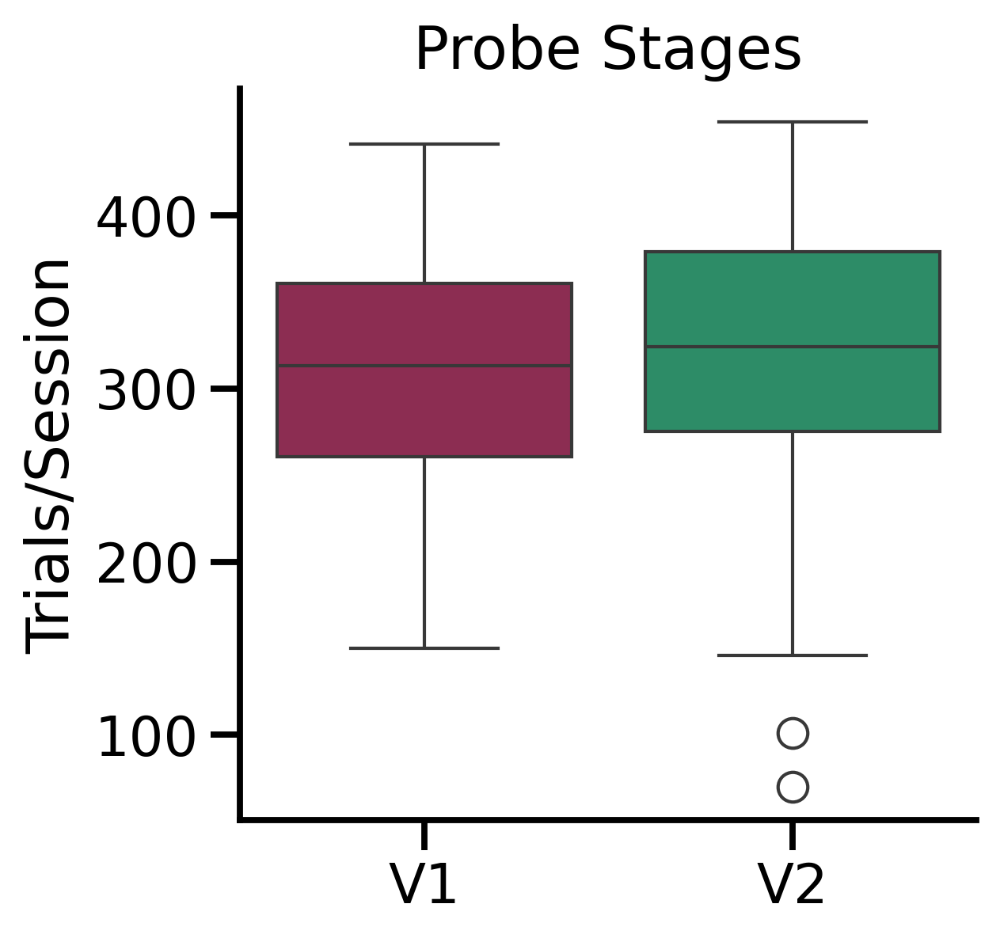

In [ ]:
fig, ax = pu.make_fig("s")
sns.boxplot(
    data=probe_trial_counts,
    x="fix_experiment",
    y="trial",
    hue="fix_experiment",
    palette=pu.ALPHA_PALLETTE,
)

sns.despine()
_ = ax.set(
    xlabel="",
    ylabel="Trials/Session",
    title="Probe Stages",
)

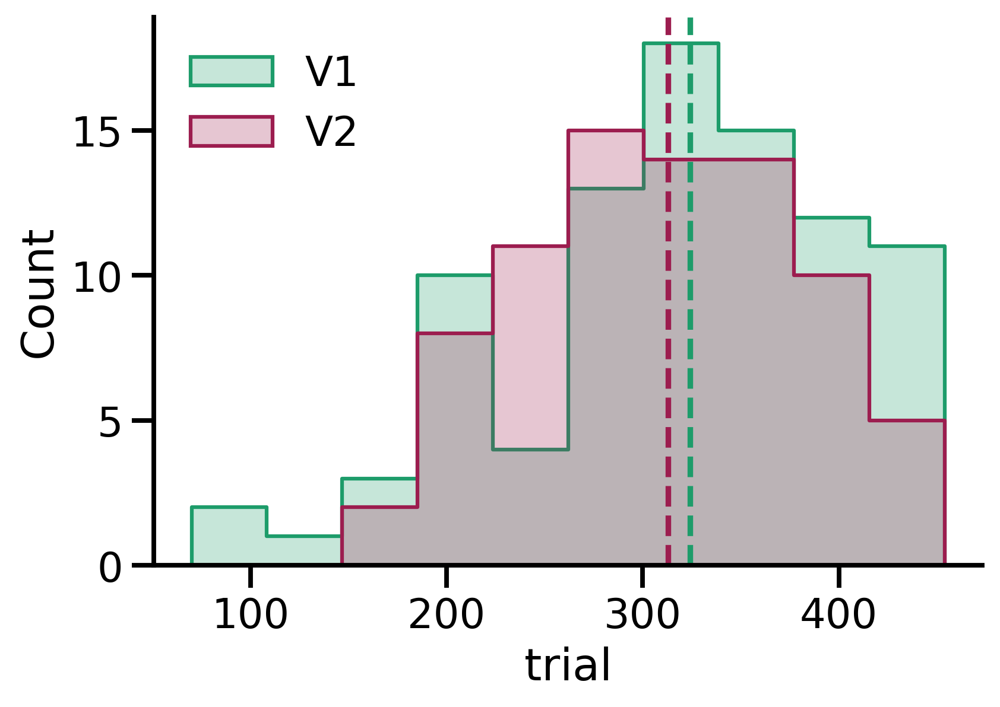

In [ ]:
fig, ax = pu.make_fig("m")
sns.histplot(
    data=probe_trial_counts,
    x="trial",
    hue="fix_experiment",
    palette=pu.ALPHA_PALLETTE,
    element="step",
)
sns.despine()

# Calculate the median for each hue category
medians = probe_trial_counts.groupby("fix_experiment", observed=True)["trial"].median()

# Plot median line for each hue
for i, (hue, median_value) in enumerate(medians.items()):
    ax.axvline(
        median_value, color=pu.ALPHA_PALLETTE[i], linestyle="--", label=f"Median {hue}"
    )

ax.legend(["V1", "V2"], title=None, frameon=False)

### 3.2.2 Hit Rates


In [ ]:
cpoke_hit_rates = (
    cpoke_learning_tdf.groupby(
        ["animal_id", "fix_experiment", "stage", "date"], observed=True
    )
    .hits.mean()
    .reset_index()
)
cpoke_hit_rates.to_csv(
    DATA_PATH + "3_2_alpha_cpoke_learning_hit_rates.csv", index=False
)

probe_hit_rates = (
    probe_tdf.groupby(["animal_id", "fix_experiment", "stage", "date"], observed=True)
    .hits.mean()
    .reset_index()
)
probe_hit_rates.to_csv(DATA_PATH + "3_2_alpha_probe_hit_rates.csv", index=False)

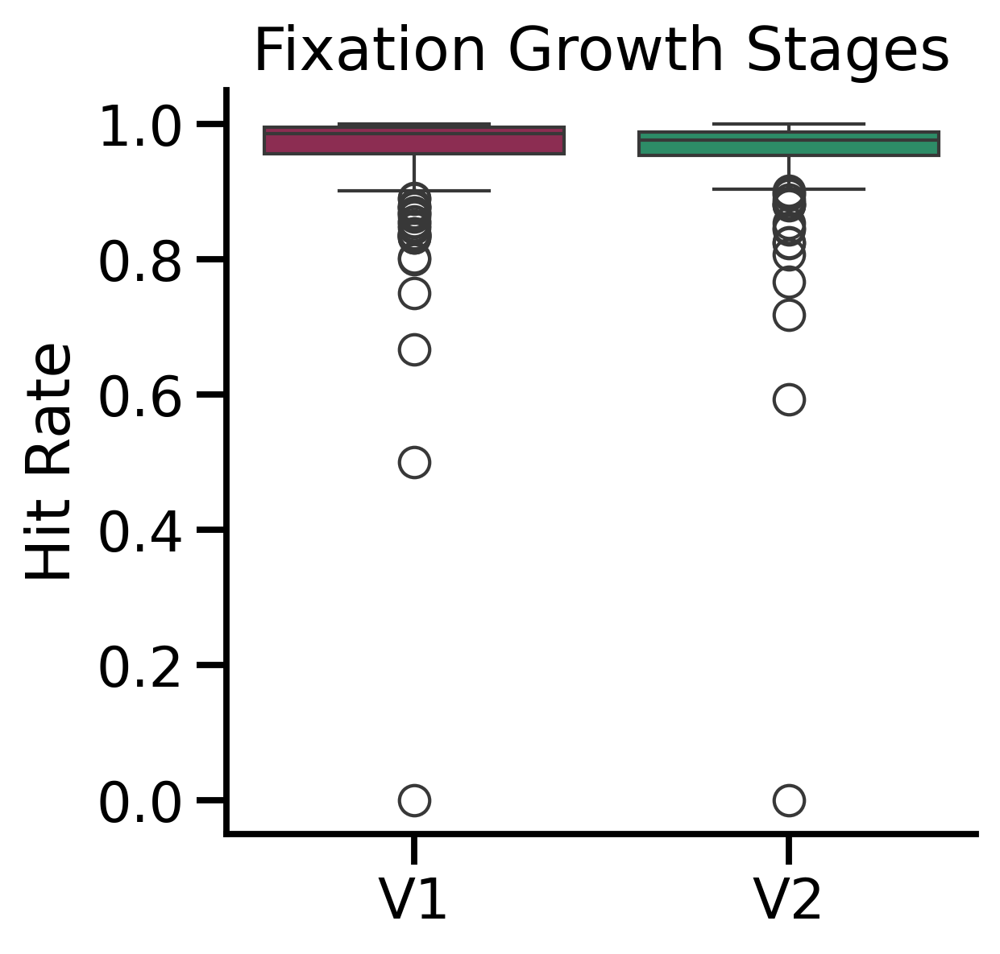

In [ ]:
fig, ax = pu.make_fig("s")
sns.boxplot(
    data=cpoke_hit_rates,
    x="fix_experiment",
    y="hits",
    hue="fix_experiment",
    palette=pu.ALPHA_PALLETTE,
)

sns.despine()
_ = ax.set(
    xlabel="",
    ylabel="Hit Rate",
    title="Fixation Growth Stages",
)

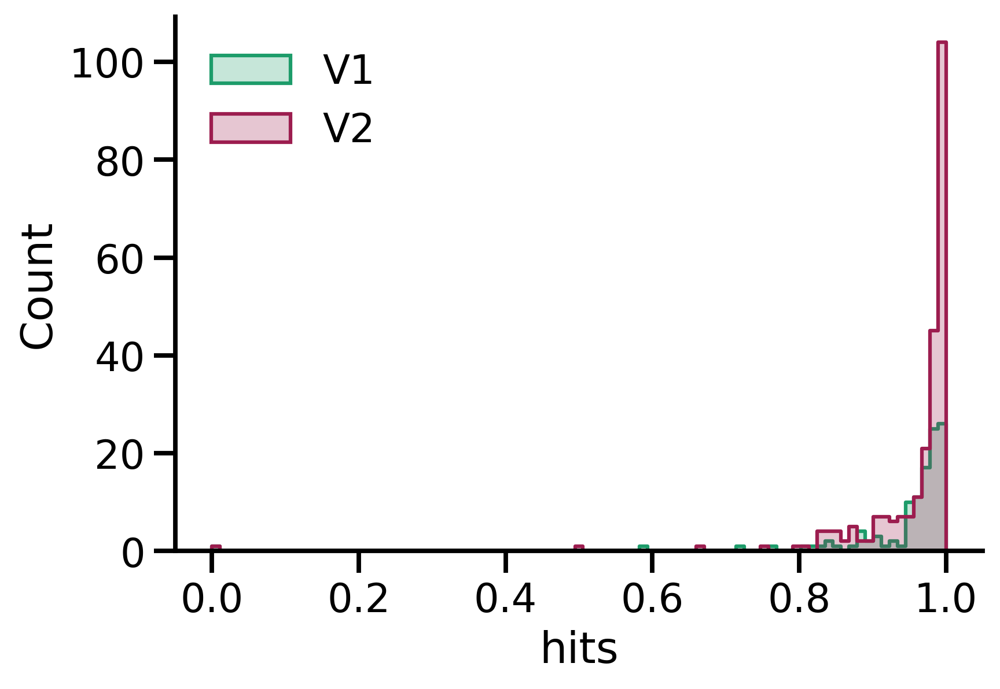

In [ ]:
fig, ax = pu.make_fig("m")
sns.histplot(
    data=cpoke_hit_rates,
    x="hits",
    hue="fix_experiment",
    palette=pu.ALPHA_PALLETTE,
    element="step",
)
sns.despine()

ax.legend(["V1", "V2"], title=None, frameon=False)

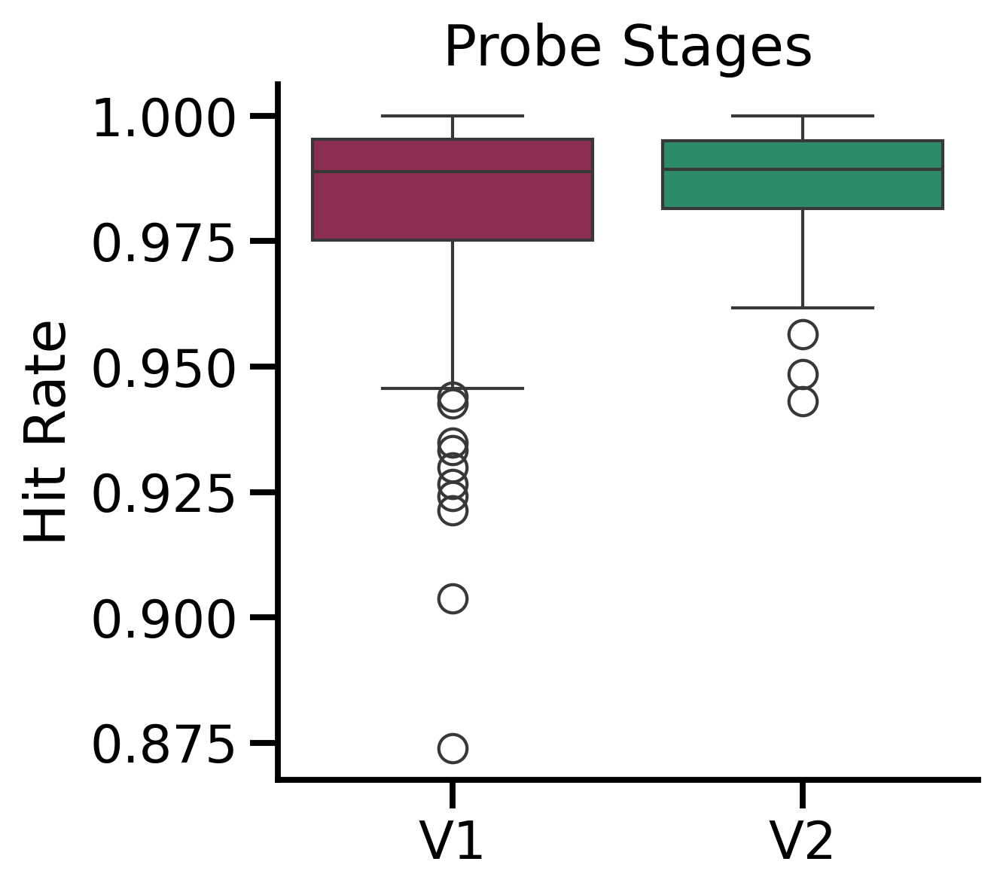

In [ ]:
fig, ax = pu.make_fig("s")
sns.boxplot(
    data=probe_hit_rates,
    x="fix_experiment",
    y="hits",
    hue="fix_experiment",
    palette=pu.ALPHA_PALLETTE,
)

sns.despine()
_ = ax.set(xlabel="", ylabel="Hit Rate", title="Probe Stages")

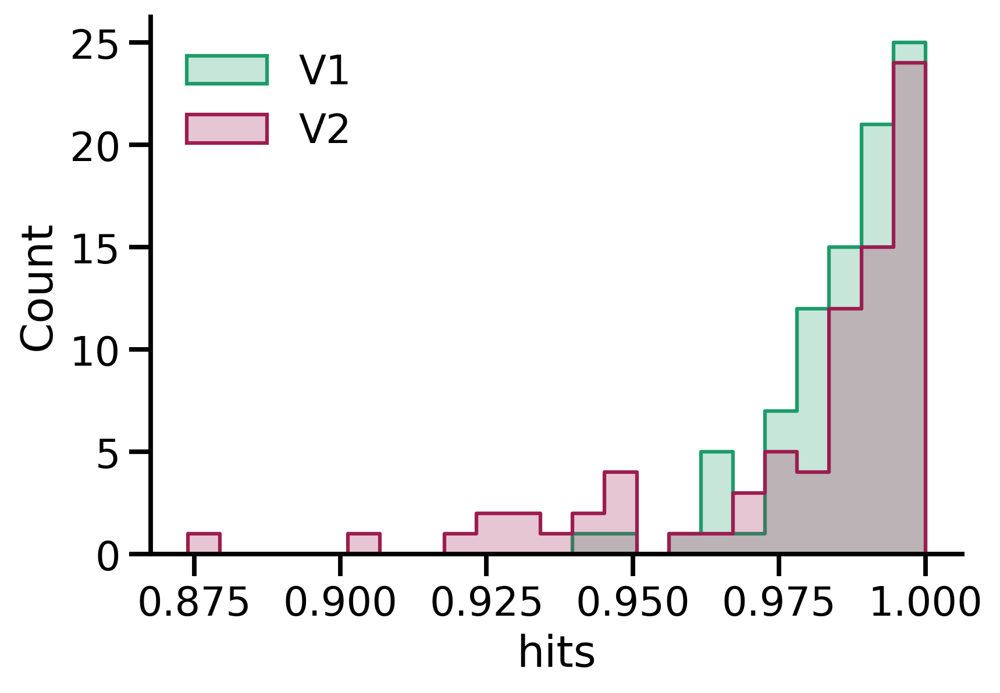

In [ ]:
fig, ax = pu.make_fig("m")
sns.histplot(
    data=probe_hit_rates,
    x="hits",
    hue="fix_experiment",
    palette=pu.ALPHA_PALLETTE,
    element="step",
)
sns.despine()


ax.legend(["V1", "V2"], title=None, frameon=False)

### 3.2.3 Hit Rate by Violation Rate


In [ ]:
probe_agg_perf = (
    probe_tdf.groupby(["animal_id", "fix_experiment", "date"], observed=True)
    .agg(
        {
            "hits": "mean",
            "violations": "mean",
        }
    )
    .reset_index()
)

probe_agg_perf.to_csv(DATA_PATH + "3_2_alpha_probe_agg_hit_viol_perf.csv", index=False)

[Text(0.5, 0, 'Violations'),
 Text(0, 0.5, 'Hits'),
 Text(0.5, 1.0, 'Probe Stages')]

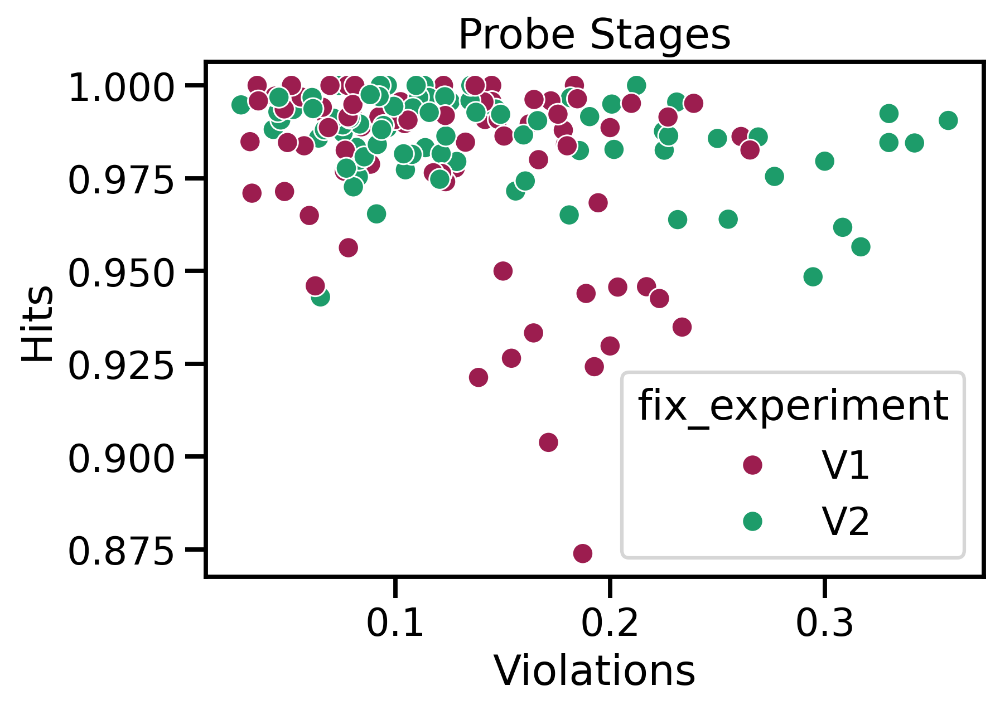

In [ ]:
fig, ax = pu.make_fig("m")
sns.scatterplot(
    data=probe_agg_perf,
    x="violations",
    y="hits",
    hue="fix_experiment",
    palette=pu.ALPHA_PALLETTE,
    ax=ax,
)

ax.set(
    xlabel="Violations",
    ylabel="Hits",
    title="Probe Stages",
)

Text(0.5, 1.0, 'Probe Stages')

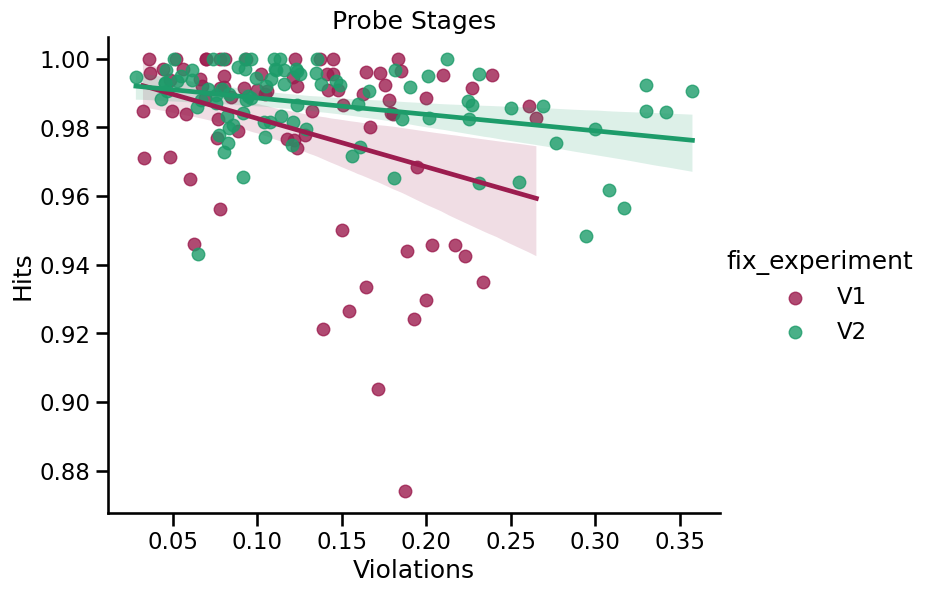

In [ ]:
sns.lmplot(
    data=probe_agg_perf,
    x="violations",
    y="hits",
    hue="fix_experiment",
    palette=pu.ALPHA_PALLETTE,
    height=6,
    aspect=1.3,
)

plt.xlabel("Violations")
plt.ylabel("Hits")
plt.title("Probe Stages")

# 4. Why?


## 4.1 Warm Up Violation Rates


In [ ]:
growing_stages

[5, 6, 7]

In [ ]:
v1df = tdf.query(
    "fix_experiment == 'V1' and stage in @growing_stages and animal_id !='R044'"
).copy()

v1df_viol_warm_up = (
    v1df.groupby(["animal_id", "warm_up_imp"]).violations.mean().reset_index()
)

v1df_viol_warm_up.to_csv(DATA_PATH + "4_1_alpha_v1_viol_warm_up.csv", index=False)

/var/folders/__/8jn6qz211155h1xb451s5zcr0000gn/T/ipykernel_23724/563105365.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  _ = ax.set_xticklabels(["On", "Off"])


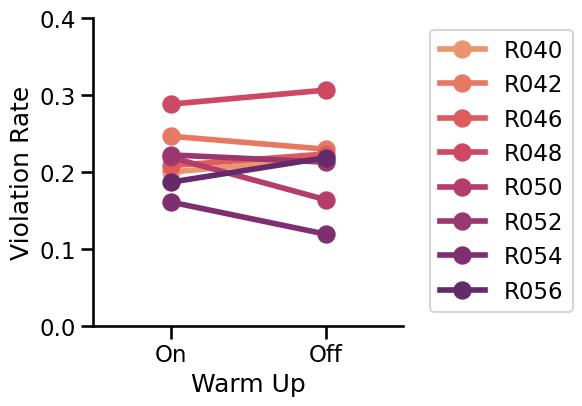

In [ ]:
fig, ax = plt.subplots(figsize=(4, 4))
sns.pointplot(
    data=v1df_viol_warm_up,
    x="warm_up_imp",
    order=[1.0, 0.0],
    y="violations",
    hue="animal_id",
    palette=pu.ALPHA_V1_palette,
    ax=ax,
)

ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
ax.set(
    xlabel="Warm Up",
    ylabel="Violation Rate",
    ylim=(0, 0.4),
)

_ = ax.set_xticklabels(["On", "Off"])
sns.despine()

Analyzing data from the following days: ['2024-08-18' '2024-08-19' '2024-08-20' '2024-08-21' '2024-08-22'
 '2024-08-23' '2024-08-24']


<Axes: title={'center': 'R054 Fixation Growth'}, xlabel='Cumulative Trial', ylabel='Fixation Duration'>

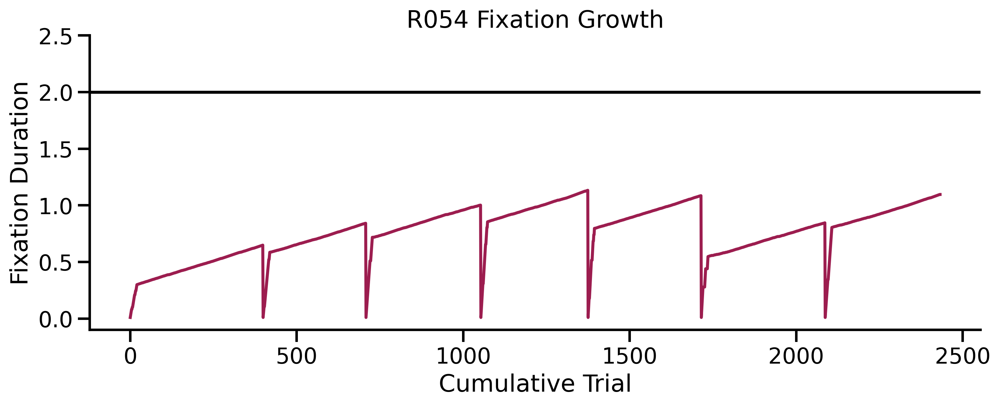

In [163]:
date_max = "2024-08-25"
plot_fixation_growth_over_trials(
    tdf.query("date < @date_max"),
    animal_id="R054",
    n_days_back=7,
    color=pu.ALPHA_V1_color,
)

Analyzing data from the following days: ['2024-08-29' '2024-08-30' '2024-09-04' '2024-09-05' '2024-09-06'
 '2024-09-07' '2024-09-08']


<Axes: title={'center': 'R056 Fixation Growth'}, xlabel='Cumulative Trial', ylabel='Fixation Duration'>

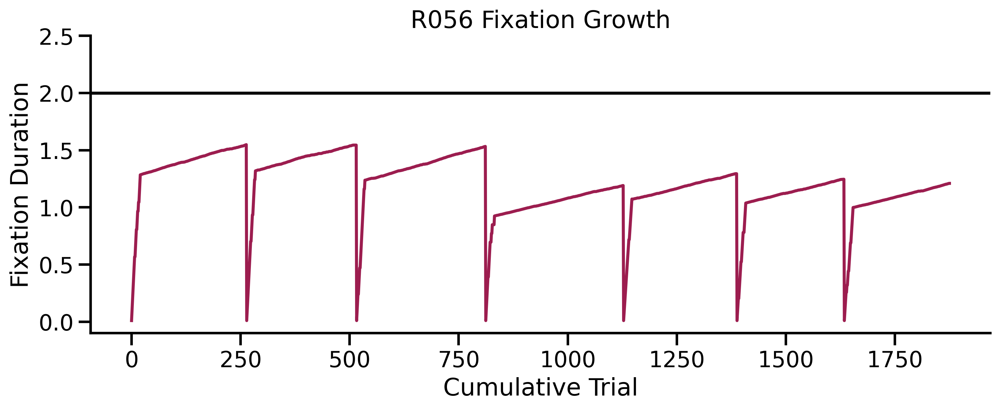

In [62]:
date_max = "2024-09-10"
plot_fixation_growth_over_trials(
    tdf.query("date < @date_max"),
    animal_id="R056",
    n_days_back=7,
    color=pu.ALPHA_V1_color,
)

Analyzing data from the following days: ['2024-08-09' '2024-08-10' '2024-08-12' '2024-08-13' '2024-08-17'
 '2024-08-18' '2024-08-19' '2024-08-20' '2024-08-21' '2024-08-22'
 '2024-08-23' '2024-08-24' '2024-08-25' '2024-08-26' '2024-08-27']


<Axes: title={'center': 'R047 Fixation Growth'}, xlabel='Cumulative Trial', ylabel='Fixation Duration'>

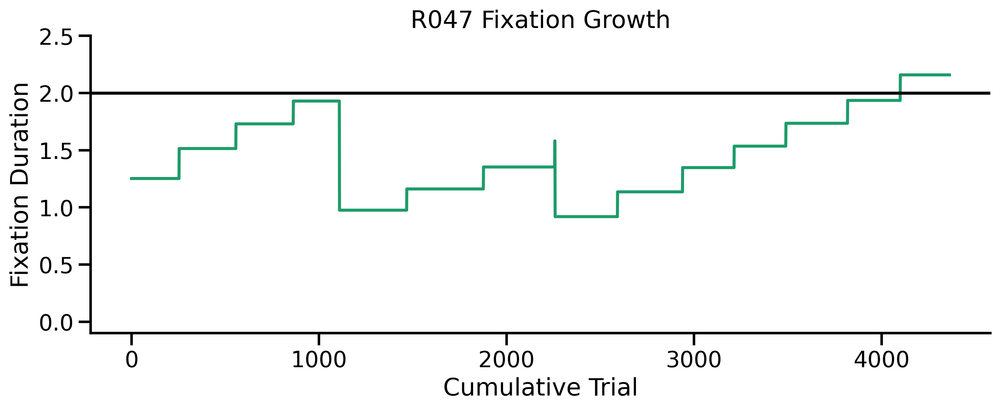

In [63]:
plot_fixation_growth_over_trials(
    tdf, animal_id="R047", n_days_back=15, color=pu.ALPHA_V2_color
)

## 4.2 Cpoke Timing


### 4.2.1 Cpoke Timing Histogram


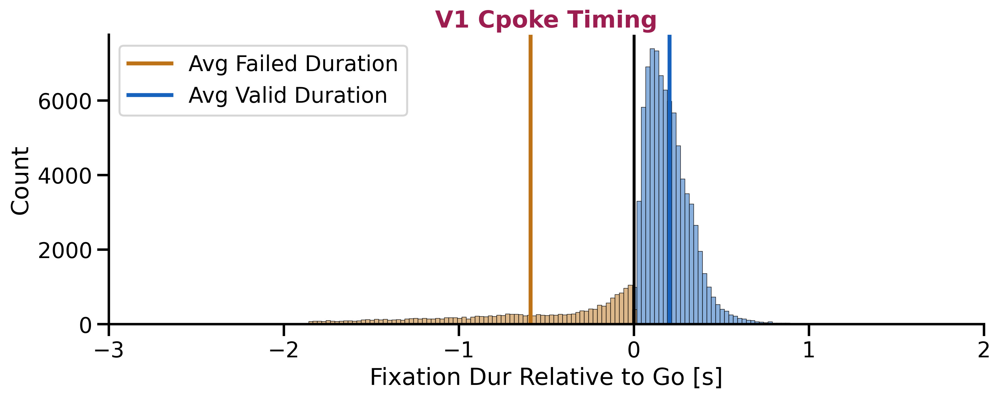

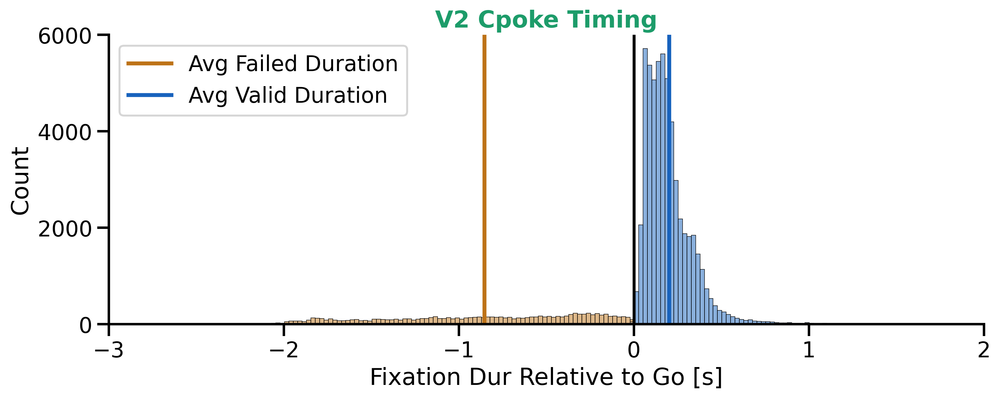

In [78]:
for fix_exp, sub_df in tdf.groupby("fix_experiment", observed=True):
    fig, ax = pu.make_fig()
    plot_df = sub_df.query("stage >=5 and stage < 11").copy()
    viz.FixationGrower.plots.plot_cpoke_dur_distributions_prettier(
        plot_df,
        xmin=-3,
        xmax=2,
        title=f"{fix_exp} Cpoke Timing",
        title_color=pu.ALPHA_V1_color if fix_exp == "V1" else pu.ALPHA_V2_color,
        ax=ax,
    )
    sns.despine()

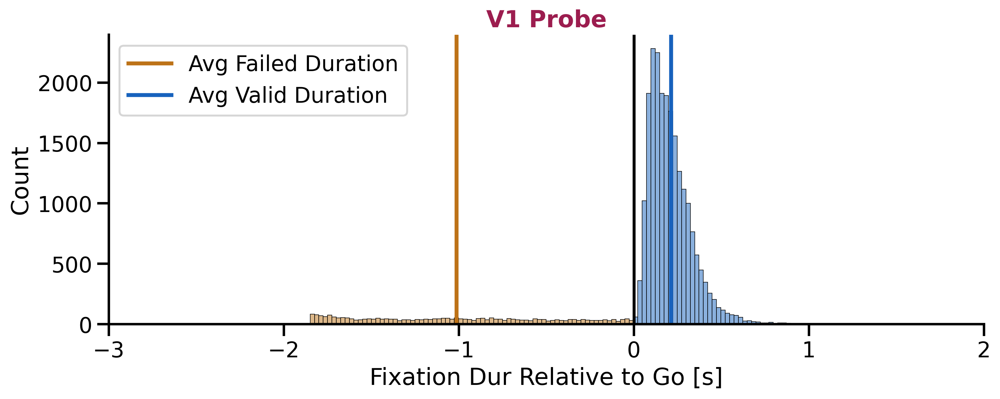

In [131]:
fig, ax = pu.make_fig()
viz.FixationGrower.plots.plot_cpoke_dur_distributions_prettier(
    tdf.query("fix_experiment =='V1' and stage in @probe_stages").copy(),
    xmin=-3,
    xmax=2,
    title="V1 Probe",
    title_color=pu.ALPHA_V1_color,
    ax=ax,
)
sns.despine()

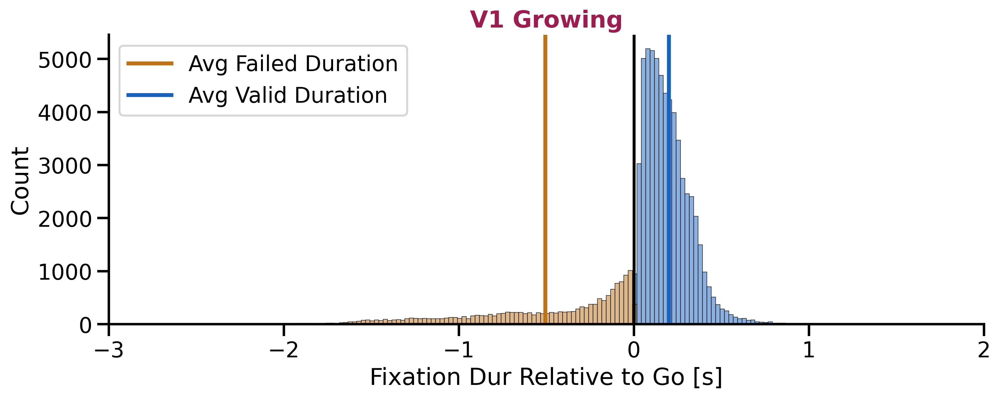

In [80]:
viz.FixationGrower.plots.plot_cpoke_dur_distributions_prettier(
    tdf.query("fix_experiment =='V1' and stage in @growing_stages").copy(),
    xmin=-3,
    xmax=2,
    title="V1 Growing",
    title_color=pu.ALPHA_V1_color,
)
sns.despine()

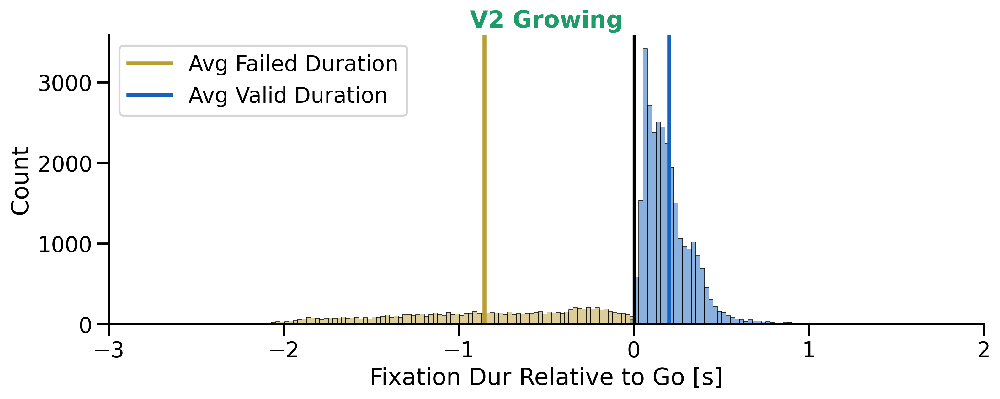

In [81]:
viz.FixationGrower.plots.plot_cpoke_dur_distributions_prettier(
    tdf.query("fix_experiment =='V2' and stage in @growing_stages").copy(),
    xmin=-3,
    xmax=2,
    title="V2 Growing",
    title_color=pu.ALPHA_V2_color,
)
sns.despine()

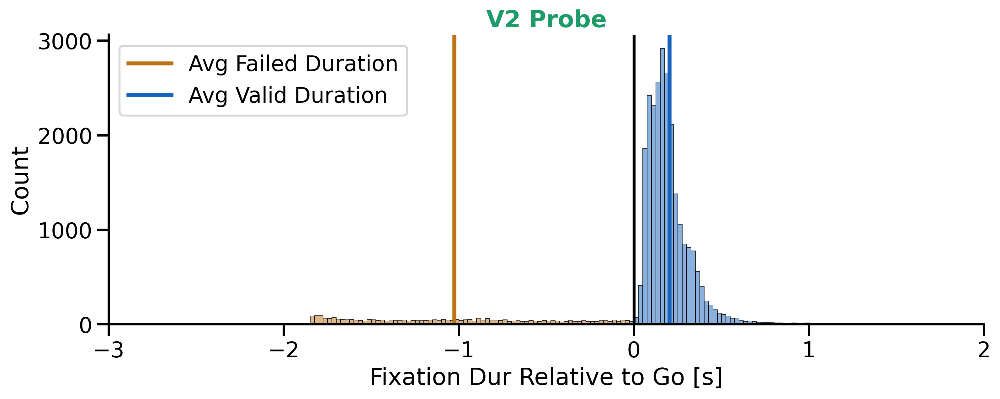

In [82]:
viz.FixationGrower.plots.plot_cpoke_dur_distributions_prettier(
    tdf.query("fix_experiment =='V2' and stage in @probe_stages").copy(),
    xmin=-3,
    xmax=2,
    title="V2 Probe",
    title_color=pu.ALPHA_V2_color,
)
sns.despine()

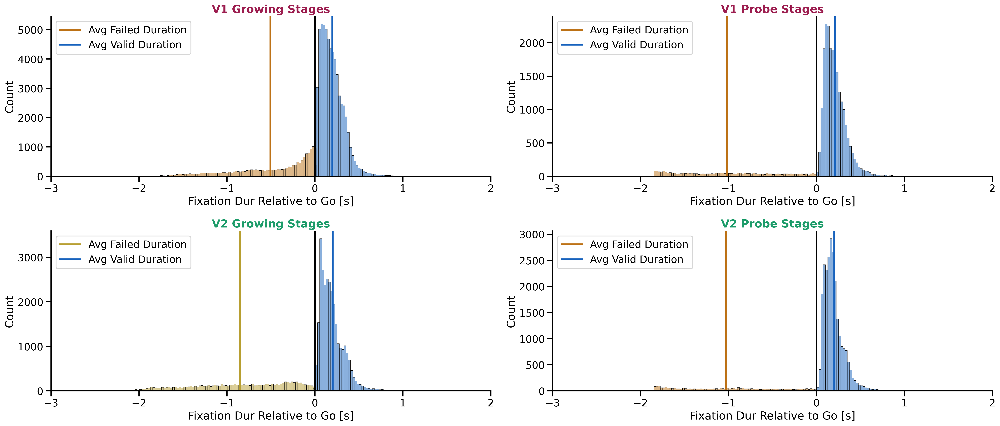

In [140]:
# Create a 2x2 subplot
fig, axes = plt.subplots(2, 2, figsize=(23, 10), dpi=300)

# Top left: V1 Growing
viz.FixationGrower.plots.plot_cpoke_dur_distributions_prettier(
    tdf.query("fix_experiment == 'V1' and stage in @growing_stages").copy(),
    xmin=-3,
    xmax=2,
    title="V1 Growing Stages",
    title_color=pu.ALPHA_V1_color,
    ax=axes[0, 0],
)
sns.despine(ax=axes[0, 0])

# Top right: V1 Probe
viz.FixationGrower.plots.plot_cpoke_dur_distributions_prettier(
    tdf.query("fix_experiment == 'V1' and stage in @probe_stages").copy(),
    xmin=-3,
    xmax=2,
    title="V1 Probe Stages",
    title_color=pu.ALPHA_V1_color,
    ax=axes[0, 1],
)
sns.despine(ax=axes[0, 1])

# Bottom left: V2 Growing
viz.FixationGrower.plots.plot_cpoke_dur_distributions_prettier(
    tdf.query("fix_experiment == 'V2' and stage in @growing_stages").copy(),
    xmin=-3,
    xmax=2,
    title="V2 Growing Stages",
    title_color=pu.ALPHA_V2_color,
    ax=axes[1, 0],
)
sns.despine(ax=axes[1, 0])

# Bottom right: V2 Probe
viz.FixationGrower.plots.plot_cpoke_dur_distributions_prettier(
    tdf.query("fix_experiment == 'V2' and stage in @probe_stages").copy(),
    xmin=-3,
    xmax=2,
    title="V2 Probe Stages",
    title_color=pu.ALPHA_V2_color,
    ax=axes[1, 1],
)
sns.despine(ax=axes[1, 1])

# Adjust layout
plt.tight_layout()
plt.show()

In [83]:
# determine which animals are fast and slow- looking at box plot 15 days
# seeems like a good cut off


growth_time_df = target_fix_df.copy()
growth_time_df["growth"] = "fast"
growth_time_df.loc[growth_time_df.days > 15, "growth"] = "slow"
growth_time_df.to_csv(DATA_PATH + "4_2_alpha_growth_time_df.csv", index=False)

fast_growth_animals = (
    growth_time_df.query("growth == 'fast'").animal_id.unique().tolist()
)
np.save(DATA_PATH + "4_2_alpha_fast_growth_animals.npy", fast_growth_animals)

slow_growth_animals = (
    growth_time_df.query("growth == 'slow'").animal_id.unique().tolist()
)
np.save(DATA_PATH + "4_2_alpha_slow_growth_animals.npy", slow_growth_animals)

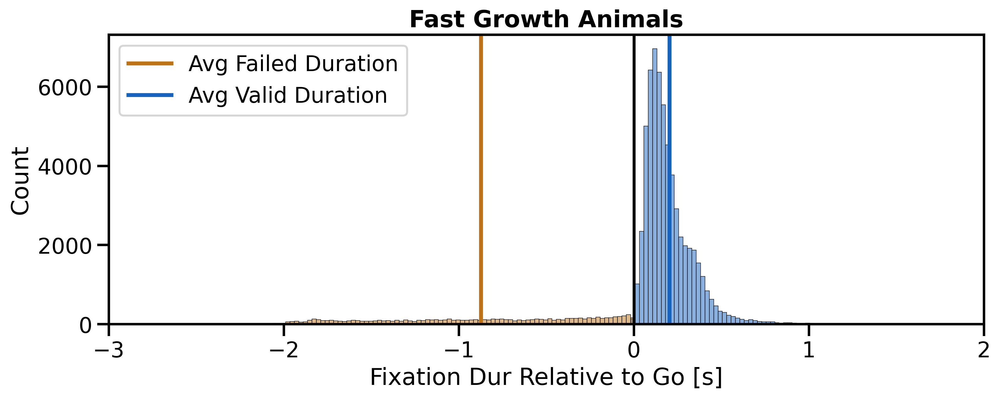

In [85]:
viz.FixationGrower.plots.plot_cpoke_dur_distributions_prettier(
    tdf.query("animal_id in @fast_growth_animals").copy(),
    xmin=-3,
    xmax=2,
    title="Fast Growth Animals",
)

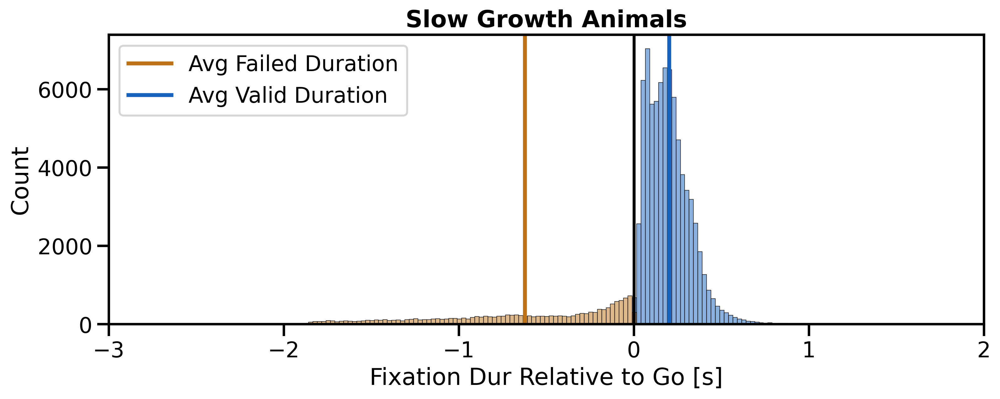

In [86]:
viz.FixationGrower.plots.plot_cpoke_dur_distributions_prettier(
    tdf.query("animal_id in @slow_growth_animals").copy(),
    xmin=-3,
    xmax=2,
    title="Slow Growth Animals",
)

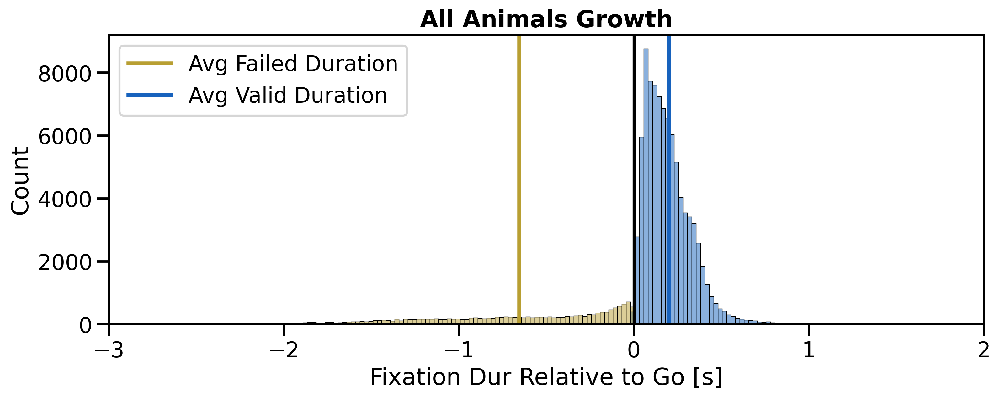

In [87]:
viz.FixationGrower.plots.plot_cpoke_dur_distributions_prettier(
    tdf.query("stage in @growing_stages").copy(),
    xmin=-3,
    xmax=2,
    title="All Animals Growth",
)

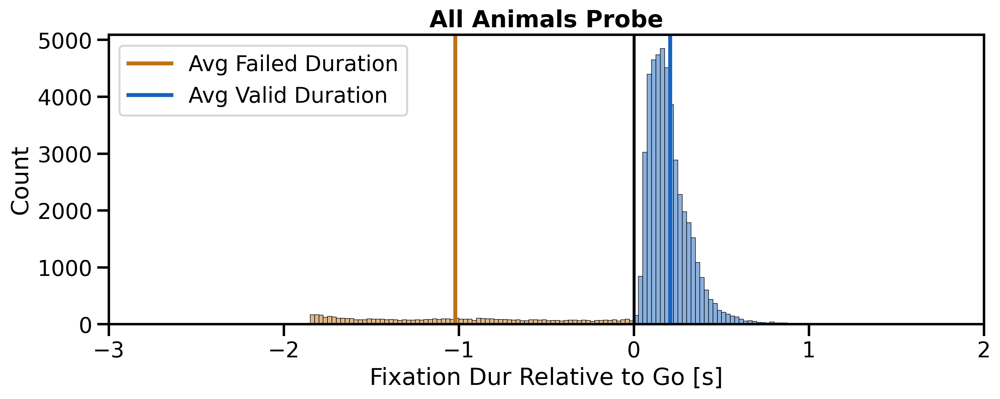

In [88]:
viz.FixationGrower.plots.plot_cpoke_dur_distributions_prettier(
    tdf.query("stage in @probe_stages").copy(),
    xmin=-3,
    xmax=2,
    title="All Animals Probe",
)

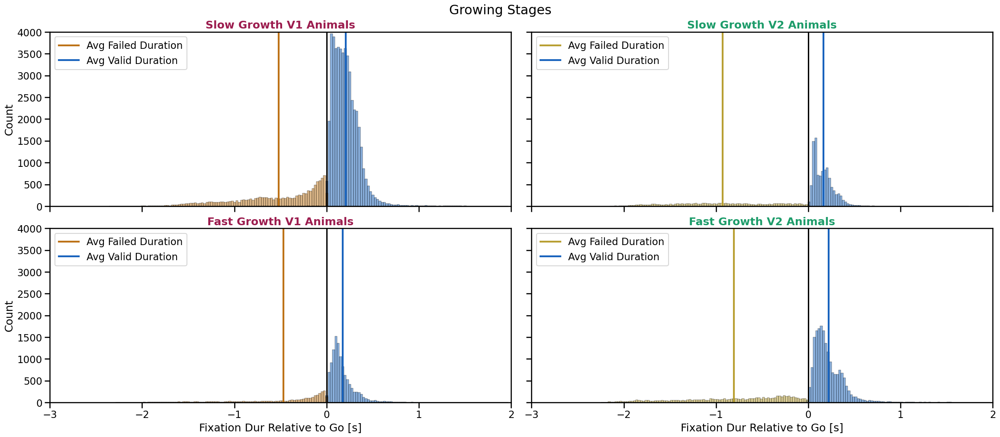

In [130]:
fig, ax = plt.subplots(
    2, 2, figsize=(23, 10), sharey=True, sharex=True, constrained_layout=True
)
plt.suptitle("Growing Stages")
stage_min = 4
stage_max = 8
ax[0, 0].set(ylim=(0, 4000))
viz.FixationGrower.plots.plot_cpoke_dur_distributions_prettier(
    tdf.query(
        "animal_id in @slow_growth_animals and fix_experiment == 'V1' and stage > @stage_min and stage < @stage_max"
    ).copy(),
    xmin=-3,
    xmax=2,
    title="Slow Growth V1 Animals",
    title_color=pu.ALPHA_V1_color,
    ax=ax[0, 0],
)

viz.FixationGrower.plots.plot_cpoke_dur_distributions_prettier(
    tdf.query(
        "animal_id in @fast_growth_animals and fix_experiment == 'V1' and stage > @stage_min and stage < @stage_max"
    ).copy(),
    xmin=-3,
    xmax=2,
    title="Fast Growth V1 Animals",
    title_color=pu.ALPHA_V1_color,
    ax=ax[1, 0],
)

viz.FixationGrower.plots.plot_cpoke_dur_distributions_prettier(
    tdf.query(
        "animal_id in @slow_growth_animals and fix_experiment == 'V2' and stage > @stage_min and stage < @stage_max"
    ).copy(),
    xmin=-3,
    xmax=2,
    title="Slow Growth V2 Animals",
    title_color=pu.ALPHA_V2_color,
    ax=ax[0, 1],
)


viz.FixationGrower.plots.plot_cpoke_dur_distributions_prettier(
    tdf.query(
        "animal_id in @fast_growth_animals and fix_experiment == 'V2' and stage > @stage_min and stage < @stage_max"
    ).copy(),
    xmin=-3,
    xmax=2,
    title="Fast Growth V2 Animals",
    title_color=pu.ALPHA_V2_color,
    ax=ax[1, 1],
)

### 3.3.2 Cpoke Timing Over Days


[Text(0.5, 0, 'Days in Fixation Growth Stage'), (-2.0, 1.0), (-0.5, 11.0)]

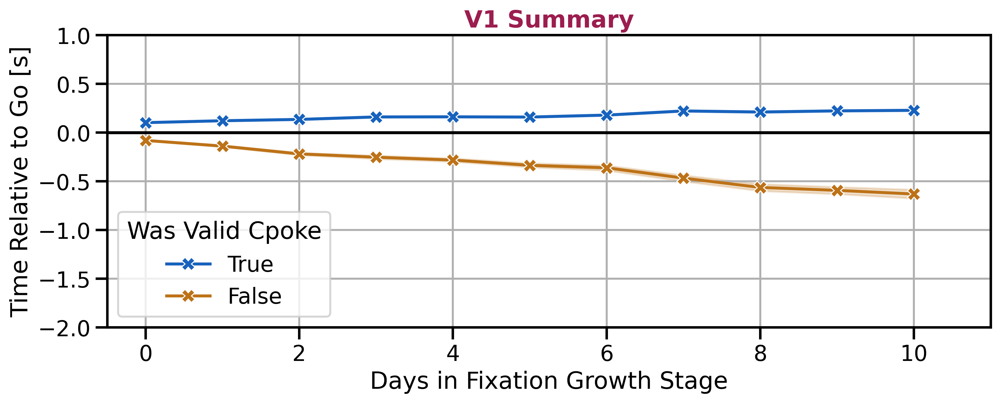

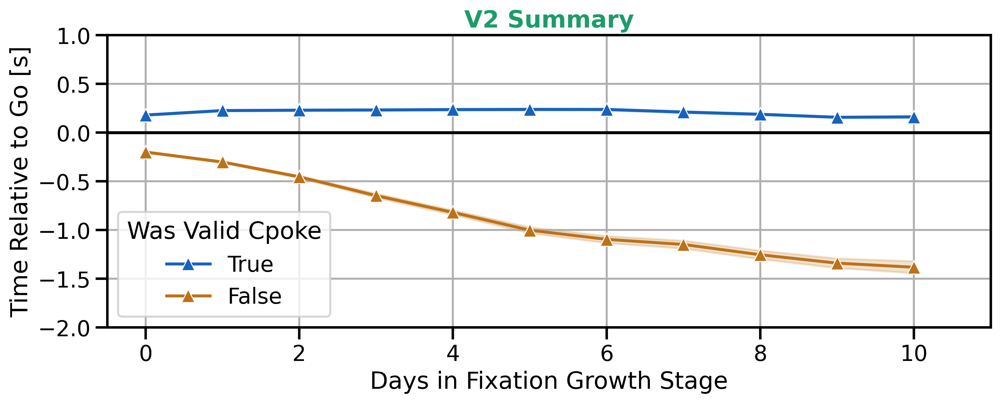

In [124]:
fix_experiment = ["V1"]
xlim = (-0.5, 11)
ylim = (-2, 1)
xlabel = "Days in Fixation Growth Stage"
max_days = 10
v1_marker = "X"
v2_marker = "^"

# First plot for V1
fig, ax = pu.make_fig()
v1_df = tdf.query("stage in @growing_stages and fix_experiment == 'V1'").copy()
viz.FixationGrower.plots.plot_cpoke_fix_stats_relative_prettier(
    v1_df,
    relative_to_stage=5,
    rotate_x_labels=False,
    title="V1 Summary",
    ax=ax,
    max_days=max_days,
    marker=v1_marker,
    markersize=10,
    title_color=pu.ALPHA_V1_color,
)
ax.set(xlabel=xlabel, ylim=ylim, xlim=xlim)

# Second plot for V2
fig, ax = pu.make_fig()
v2_df = tdf.query("stage in @growing_stages and fix_experiment == 'V2'").copy()
viz.FixationGrower.plots.plot_cpoke_fix_stats_relative_prettier(
    v2_df,
    relative_to_stage=5,
    rotate_x_labels=False,
    title="V2 Summary",
    ax=ax,
    max_days=max_days,
    marker=v2_marker,
    markersize=10,
    title_color=pu.ALPHA_V2_color,
)
ax.set(xlabel=xlabel, ylim=ylim, xlim=xlim)

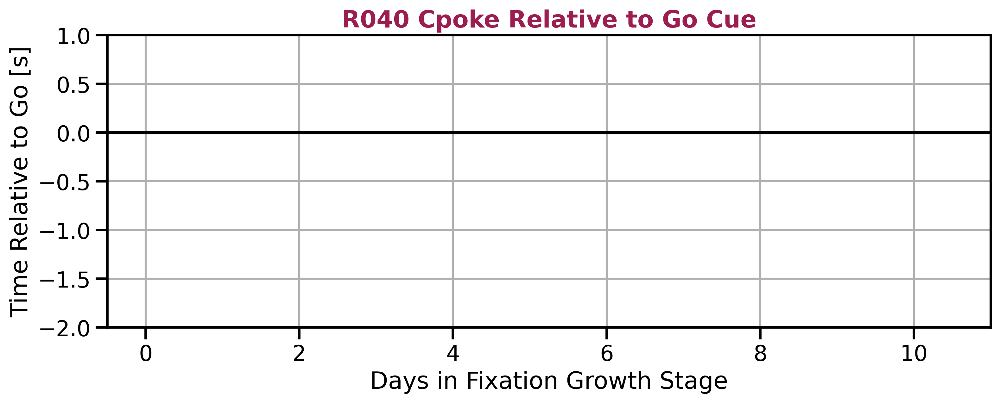

In [125]:
min_stage = 5
max_stage = 7
example_animal = "R040"
fig, ax = pu.make_fig()
viz.FixationGrower.plots.plot_cpoke_fix_stats_relative_prettier(
    tdf.query(
        "animal_id ==@example_animal and stage >= @min_stage and stage <= @max_stage"
    ).copy(),
    relative_to_stage=5,
    rotate_x_labels=False,
    title=f"{example_animal} Cpoke Relative to Go Cue",
    max_days=max_days,
    marker=v1_marker,
    markersize=10,
    ax=ax,
    errorbar=None,
    legend=False,
    alpha=0,
    title_color=pu.ALPHA_V1_color,
)

# ax.get_legend().remove()
_ = ax.set(ylim=ylim, xlim=xlim, xlabel=xlabel)

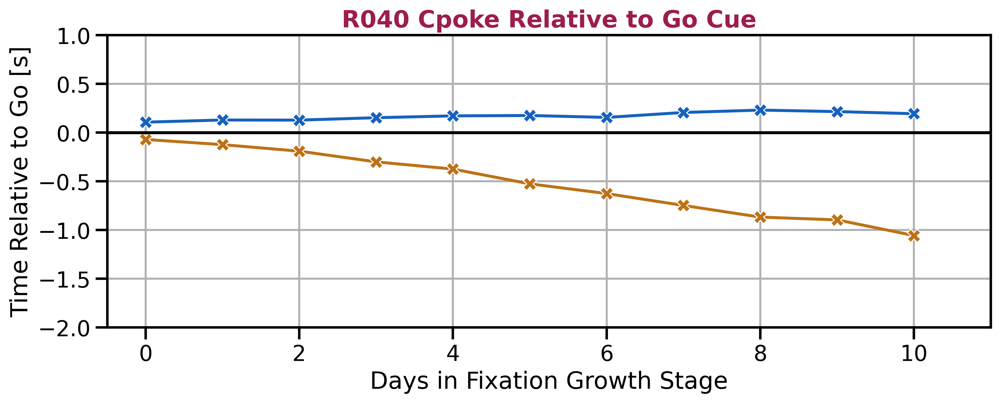

In [126]:
min_stage = 5
max_stage = 7
example_animal = "R040"
fig, ax = pu.make_fig()
viz.FixationGrower.plots.plot_cpoke_fix_stats_relative_prettier(
    tdf.query(
        "animal_id ==@example_animal and stage >= @min_stage and stage <= @max_stage"
    ).copy(),
    relative_to_stage=5,
    rotate_x_labels=False,
    title=f"{example_animal} Cpoke Relative to Go Cue",
    max_days=max_days,
    marker=v1_marker,
    markersize=10,
    ax=ax,
    errorbar=None,
    title_color=pu.ALPHA_V1_color,
)

# ax.get_legend().remove()
_ = ax.set(ylim=ylim, xlim=xlim, xlabel=xlabel)
ax.get_legend().remove()

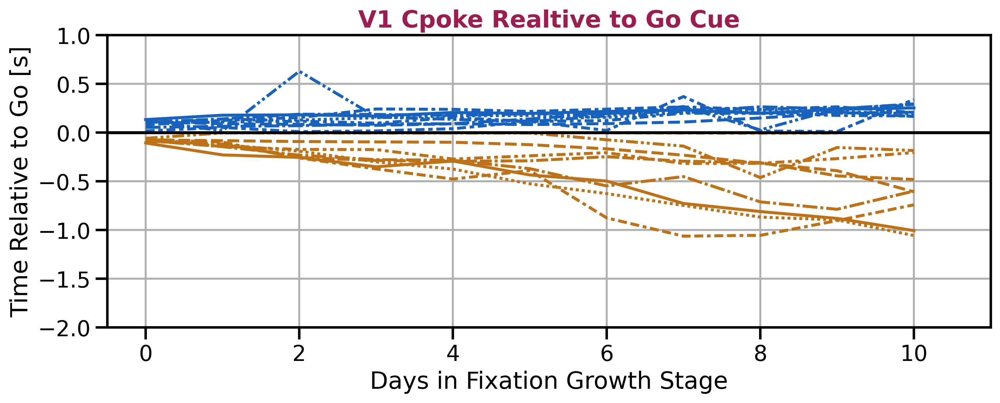

In [127]:
fix_experiment = ["V1"]
fig, ax = pu.make_fig()
viz.FixationGrower.plots.plot_cpoke_fix_stats_relative_prettier(
    tdf.query("fix_experiment in @fix_experiment and stage in @growing_stages").copy(),
    relative_to_stage=5,
    rotate_x_labels=False,
    title="V1 Cpoke Realtive to Go Cue",
    style="animal_id",
    max_days=max_days,
    marker=None,
    ax=ax,
    errorbar=None,
    title_color=pu.ALPHA_V1_color,
)

ax.legend(bbox_to_anchor=(1.05, 1))
ax.set(ylim=ylim, xlim=xlim, xlabel=xlabel)
ax.get_legend().remove()

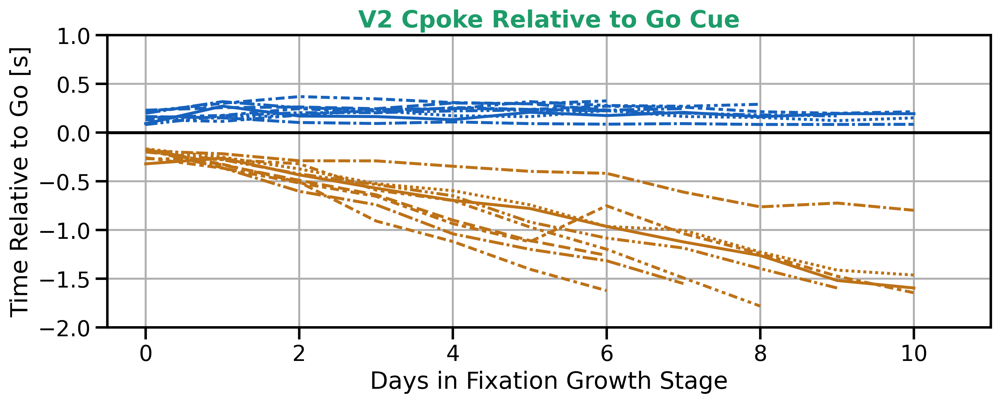

In [128]:
fix_experiment = ["V2"]

fig, ax = pu.make_fig()
viz.FixationGrower.plots.plot_cpoke_fix_stats_relative_prettier(
    tdf.query("fix_experiment in @fix_experiment and stage in @growing_stages").copy(),
    relative_to_stage=5,
    rotate_x_labels=False,
    title="V2 Cpoke Relative to Go Cue",
    style="animal_id",
    ax=ax,
    max_days=max_days,
    marker=None,
    errorbar=None,
    title_color=pu.ALPHA_V2_color,
)

ax.legend(bbox_to_anchor=(1.05, 1))
ax.set(ylim=ylim, xlim=xlim, xlabel=xlabel)
ax.get_legend().remove()

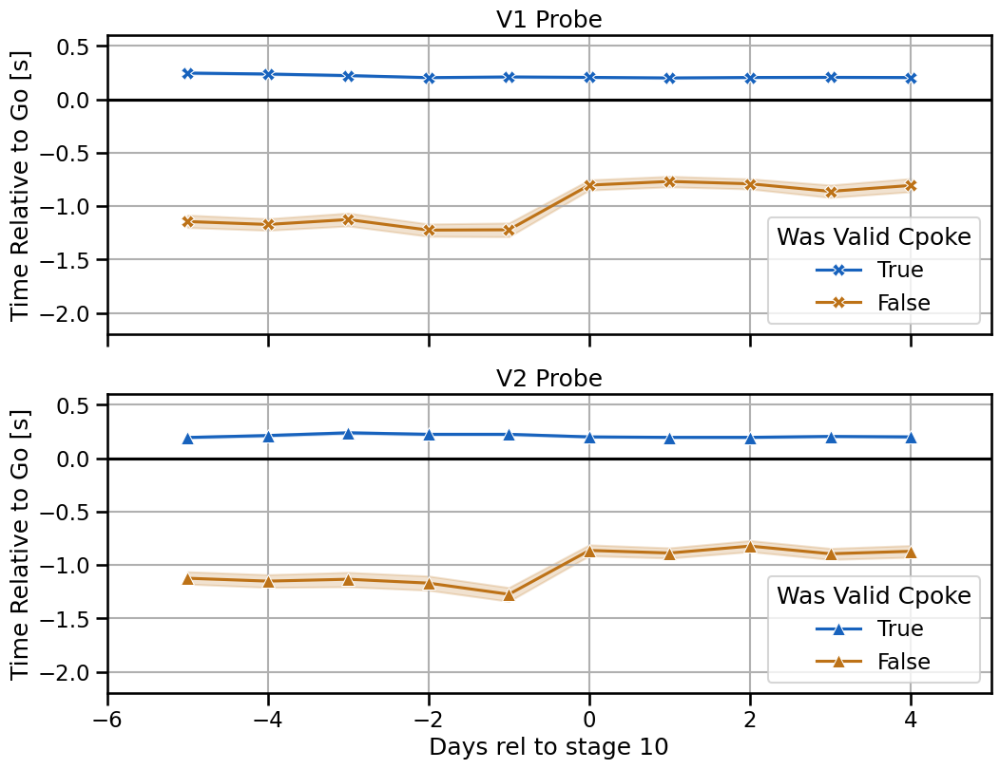

In [113]:
fig, ax = plt.subplots(2, 1, figsize=(12, 9), sharex=True, sharey=True)

ax[0].set(ylim=(-2.2, 0.6), xlim=(-6, 5))
for i, (fix_exp, sub_df) in enumerate(
    tdf.query("stage in @probe_stages").copy().groupby("fix_experiment", observed=True)
):
    viz.FixationGrower.plots.plot_cpoke_fix_stats_relative_prettier(
        sub_df,
        relative_to_stage=10,
        rotate_x_labels=False,
        title=f"{fix_exp} Probe",
        ax=ax[i],
        max_days=max_days,
        marker=v1_marker if fix_exp == "V1" else v2_marker,
        markersize=10,
    )

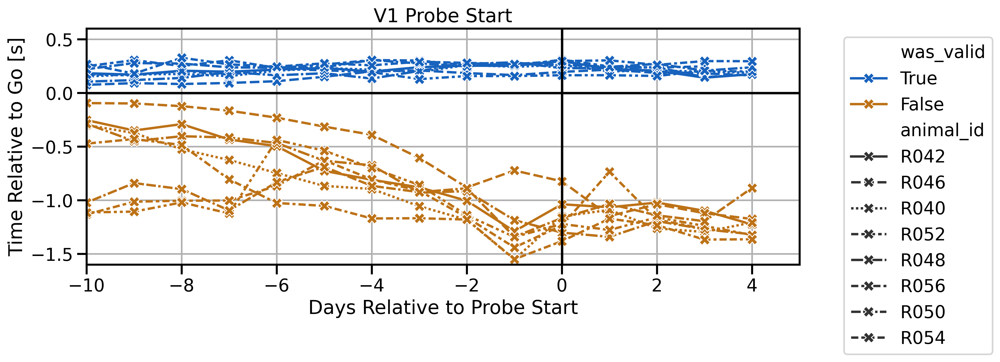

In [122]:
min_stage = 7
max_stage = 9
fix_experiment = ["V1"]
fig, ax = pu.make_fig()
viz.FixationGrower.plots.plot_cpoke_fix_stats_relative_prettier(
    tdf.query(
        "fix_experiment in @fix_experiment and stage >= @min_stage and stage <= @max_stage"
    ).copy(),
    relative_to_stage=9,
    rotate_x_labels=False,
    title="V1 Probe Start",
    style="animal_id",
    max_days=max_days,
    marker=v1_marker,
    markersize=10,
    ax=ax,
    errorbar=None,
)

ax.legend(bbox_to_anchor=(1.05, 1))
ax.set(ylim=(-1.6, 0.6), xlim=(-10, 5), xlabel="Days Relative to Probe Start")
ax.axvline(0, color="k")

## 4.3 Violation ITI


In [141]:
iti = ViolationITI()
probe_stages = [9, 10]
grow_stages = [5, 6, 7]
iti_df = iti.compute_and_add_viol_iti_column(
    tdf.query("stage >= 5 and stage <=11").copy()
)

iti_df.to_csv(DATA_PATH + "4_3_alpha_voil_iti_df.csv", index=False)

In [142]:
xlim = (0, 25)
ylim = (0, 45)
ylabel = "Percent of Trials"
xlabel = "Inter Violation Interval (N Trials)"

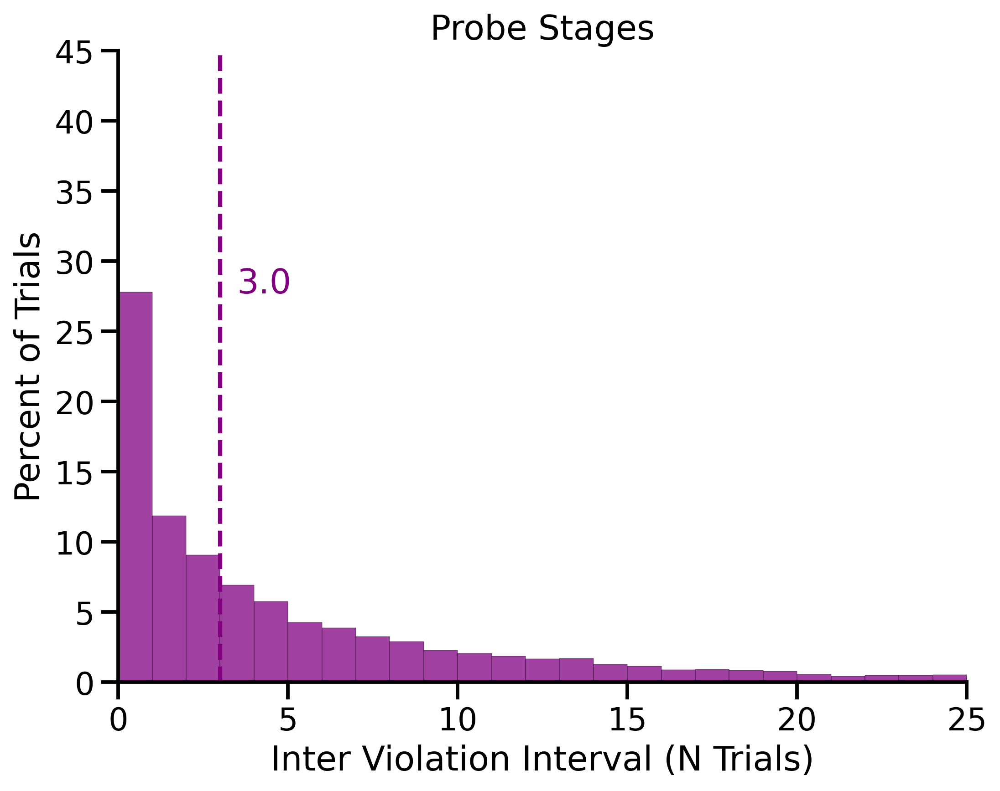

In [143]:
probe_iti_df = iti_df.query("stage in @probe_stages").copy()
ax = plot_violation_iti(probe_iti_df, color="purple")

_ = ax.set(
    xlim=xlim,
    ylim=ylim,
    xlabel=xlabel,
    ylabel=ylabel,
    title="Probe Stages",
)

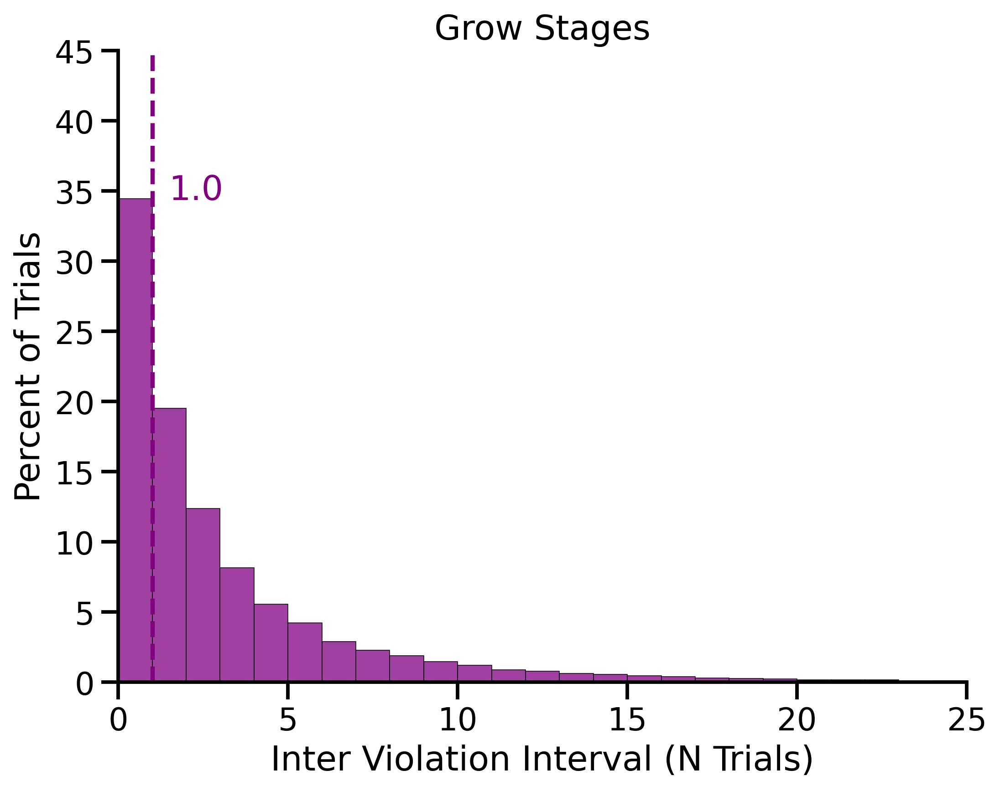

In [144]:
grow_iti_df = iti_df.query("stage in @grow_stages").copy()
ax = plot_violation_iti(grow_iti_df, color="purple")

_ = ax.set(
    xlim=xlim,
    ylim=ylim,
    xlabel=xlabel,
    ylabel=ylabel,
    title="Grow Stages",
)

<Axes: title={'center': 'V2 Probe Stages'}, xlabel='Inter Violation Interval (N Trials)', ylabel='Percent of Trials'>

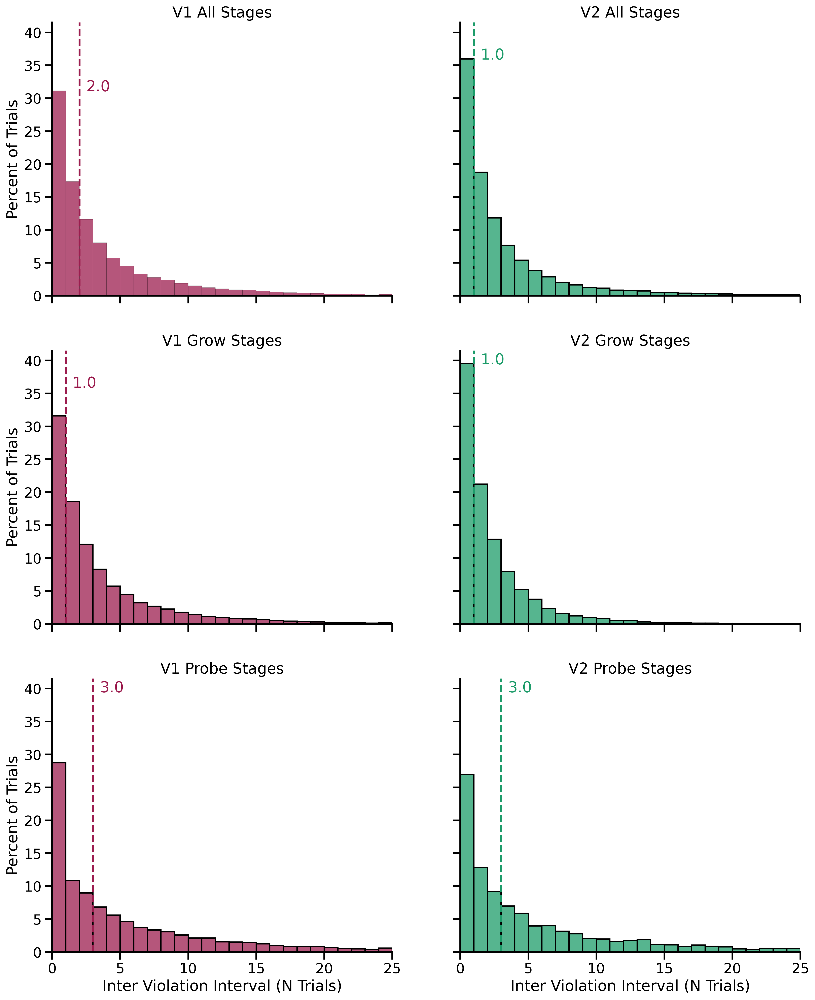

In [145]:
fig, ax = plt.subplots(3, 2, figsize=(16, 20), dpi=300, sharey=True, sharex=True)

plot_violation_iti(
    iti_df.query("fix_experiment == 'V1'"),
    color=pu.ALPHA_V1_color,
    title="V1 All Stages",
    ax=ax[0, 0],
)

plot_violation_iti(
    iti_df.query("fix_experiment == 'V2'"),
    color=pu.ALPHA_V2_color,
    title="V2 All Stages",
    ax=ax[0, 1],
)

plot_violation_iti(
    iti_df.query("fix_experiment == 'V1' and stage in @grow_stages"),
    color=pu.ALPHA_V1_color,
    title="V1 Grow Stages",
    ax=ax[1, 0],
)

plot_violation_iti(
    iti_df.query("fix_experiment == 'V2' and stage in @grow_stages"),
    color=pu.ALPHA_V2_color,
    title="V2 Grow Stages",
    ax=ax[1, 1],
)

plot_violation_iti(
    iti_df.query("fix_experiment == 'V1' and stage in @probe_stages"),
    color=pu.ALPHA_V1_color,
    title="V1 Probe Stages",
    ax=ax[2, 0],
)

plot_violation_iti(
    iti_df.query("fix_experiment == 'V2' and stage in @probe_stages"),
    color=pu.ALPHA_V2_color,
    title="V2 Probe Stages",
    ax=ax[2, 1],
)